# Overview
This notebook exclusively analyzes the 55 Cancri system by testing a 4-planet hypothesis, with a Gaussian process to model stellar activity. After the 4-planet model is constructed and analyzed, we demonstrate our post-hoc method of estimating jitter. We also include a demonstration of detrending the RVs using a Gaussian high-pass filter (GF). 

In order to run this notebook, you will need to download all of the python packages we use. The complete list of used packages can be found at the top of the "functions.py" file in the repository.

In [1]:
from functions import * # See functions.py for the list of used functions

In [2]:
# Orbital parameters
f_mag = 1.0/(10.5*365.25) #This equals 1/3835.125 (Bourrier value: 1.0/3822.4)
f_rot = 1.0/(38.8) # From Bourrier et al. 2018
planet_b = 1.0/14.65314 # (Bourrier value: 1.0/14.6516)          
planet_c = 1.0/44.373 #(Bourrier value: 1.0/44.3989)             
planet_d = 1.0/4867  #(Bourrier value: 1.0/5574.2)               
planet_e = 1.0/0.7365478 #(Bourrier value: 1.0/0.73654737) # has transit confirmation
planet_f = 1.0/260.91 #(Bourrier value: 1.0/259.88)              
lunar = 1.0/29.53

planets = [planet_b, planet_c, planet_d, planet_e, planet_f]

In [3]:
# Read in RV and S-index
inst_Bourrier  = np.loadtxt("data/Bourrier_RV.txt", dtype = str, usecols = (5), skiprows = 43)
t_Bourrier, RV_Bourrier, RVerr_Bourrier, S_Bourrier, Serr_Bourrier = np.loadtxt("data/Bourrier_RV.txt", usecols = (0, 1, 2, 3, 4), skiprows = 43, unpack = True ) # BINNED, TRENDED 
t_Bourrier = t_Bourrier + 2400000.0 # Shift to BJD

# Sort by time index
t_Bourrier, RV_Bourrier, RVerr_Bourrier, inst_Bourrier = sort_time(t_Bourrier, RV_Bourrier, RVerr_Bourrier, inst_Bourrier)

# Construct the Keplerian model

Fit linear parameters:
Parameter                        Value     Error       
lin.offset_inst_HARPN       27391.0595  ±  0.0373      
lin.offset_inst_HARPS       27463.0762  ±  0.0481      
lin.offset_inst_HRS          28354.962  ±  0.226       
lin.offset_inst_KECK          -14.0313  ±  0.0434      
lin.offset_inst_LICK            2.0091  ±  0.0923      
lin.offset_inst_SOPHIE      27461.2180  ±  0.0982      
lin.offset_inst_TULL        -22557.388  ±  0.164       

loglikelihood = -1555297.8373726257


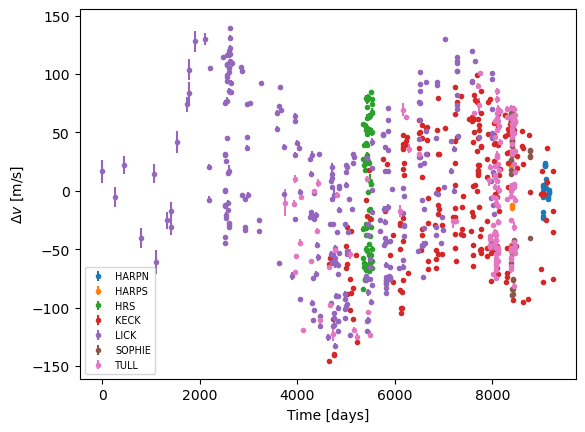

In [4]:
instruments = inst_Bourrier 
fit_method = 'L-BFGS-B' # Can also try Nelder-Mead
fit_options = {
    'maxiter': 1000,
    'maxcor': 50
}
fit_ecc = True
fap_max = 1e-3 # FAP over this value terminates the agnostic DACE search

rv_model = rv.RvModel(t_Bourrier-t_Bourrier[0], RV_Bourrier, err = term.Error(RVerr_Bourrier))

# Construct a dictionary for the RV data
rv_dict = {}
rv_dict['jd'] = t_Bourrier-t_Bourrier[0] 
rv_dict['rv'] = RV_Bourrier
rv_dict['rv_err'] = RVerr_Bourrier
rv_dict['ins_name'] = instruments

RR = 1./(max(rv_dict['jd'])-rv_dict['jd'][0]) # Rayleigh Resolution, to be used in frequency analysis

# Add linear parameters
for inst in np.unique(instruments):
    rv_model.add_lin(1.0*(rv_dict['ins_name']==inst), f'offset_inst_{inst}') 

print("Fit linear parameters:")
rv_model.fit(method=fit_method, options=fit_options)
rv_model.show_param()
print('loglikelihood =', rv_model.loglike())

rv_err = np.sqrt(rv_model.cov.A)
plt.figure()
for inst in np.unique(instruments):
    kinst = rv_dict['ins_name'] == inst
    plt.errorbar(rv_dict['jd'][kinst], 
        rv_dict['rv'][kinst] - rv_model.get_param(f'lin.offset_inst_{inst}'),
        yerr=rv_err[kinst],
        fmt='.', rasterized=True, label = inst)
plt.xlabel('Time [days]') 
plt.ylabel('$\Delta v$ [m/s]')
plt.legend(loc = 'lower left', fontsize = 'x-small')
plt.show()

In [5]:
RR = 1./(max(rv_dict['jd'])-rv_dict['jd'][0])
df = RR/2
f_N = 1./(2*np.median(np.diff(rv_dict['jd']))) # Nyquist frequency
f = np.arange(0, f_N, df)

In [6]:
def remove_kep_without_jitter(RV_DICT, RV_MODEL, signals, fit_param = True):
    time, RV, rverr = RV_DICT['jd'],  RV_DICT['rv'], RV_DICT['rv_err']
    rv_model = RV_MODEL # Just redine for c/p reasons
    N = len(time)
    # Customize frequency array
    RR = 1./(max(time)-time[0])
    delta_f = RR/2
    f_N = 1./(2*np.median(np.diff(rv_dict['jd']))) # Nyquist frequency
    f = np.arange(0, f_N, delta_f)
    
    N_signals = len(signals)
    loglike = np.zeros(N_signals)
    LR = np.zeros(N_signals - 1)
    BIC = np.zeros(N_signals - 1)
    p_val = np.zeros(N_signals - 1)
    df = 5 # Degrees of freedom in Keplerian model 
    alpha = 0.01 # Critical p-value
    LR_cutoff = chi2.ppf(1-alpha, df) # Cutoff for LR hypothesis testing
    # Loop through, removing planets
    for passthrough in range(N_signals): 
        res = rv_model.residuals() # Update residual 
        rv_err = np.sqrt(rv_model.cov.A)

        # Plot the RV residual scatterplot 
        plot_residual(RV_DICT, res, rv_model, passthrough)     
        fls, pls, GLS_window, percentiles = GLS_calc(time, res, bootstrap = True) 

        # Plot the GLS periodogram of the residual
        plot_GLS(fls, pls, percentiles, passthrough)
        
        print('Removing orbit of P={} d \n'.format(1.0/signals[passthrough])) 
        rv_model.add_keplerian_from_period((1.0/signals[passthrough]), fit = True)
        rv_model.set_keplerian_param(f'{rv_model.nkep-1}', param=['P', 'la0', 'K', 'e', 'w'])
        if not fit_ecc:
            rv_model.set_param(np.zeros(2), rv_model.fit_param[-2:])
            rv_model.fit_param = rv_model.fit_param[:-2]
        # Global fit of the model
        if fit_param:
            print("Fitting model parameters: ")
            rv_model.fit(method=fit_method, options=fit_options)
        rv_model.show_param()
        print('loglikelihood = {}\n'.format(rv_model.loglike()))
        #print("Residual RMS: ", np.sqrt(np.mean(res**2)))
        #print("Residual Chi^2: ", rv_model.chi2())
        loglike[passthrough] = rv_model.loglike()
        
    # After the final iteration of the loop, plot the final resiudal scatter plot and GLS
    res = rv_model.residuals() # Final Update of residual 
    rv_err = np.sqrt(rv_model.cov.A)

    fls, pls, GLS_window, percentiles = GLS_calc(time, res, bootstrap = True)

    plot_residual(RV_DICT, res, rv_model, (passthrough+1))
    plot_GLS(fls, pls, percentiles, passthrough+1)
    
    # Compute Likelihood Ratio test for the nested planetary models
    for i in range(len(LR)):
        LR[i] = 2*(loglike[i+1] - loglike[i]) # Order is less restrictive model minus more restrictive (more params - less params) 
        p_val[i] = chi2.sf(LR[i], df) # 1 - cdf  
        BIC[i] = len(rv_model.get_param())*np.log(len(RV)) - 2*loglike[i]
    
    print("LR cutoff for significance: ", LR_cutoff)
    print("\t ~~ 55Cnc No Jitter ~~", "\nloglike : ", loglike, "\nLR = ", LR, "\n")
    print("p-values: ", p_val, "\n")
    print("Bayesian information criterion: ", BIC)
    
    return rv_model, res, loglike, LR, p_val

Let's compute the 4-Keplerian model, without planet d. 4 instances of bootstrapped FALs in the periodograms will take some time. $P = 391 = N/2$ days is a spectral window artifact. Later in this notebook, we'll repeat this using RVs detrended by a Gaussian Filter (GF).

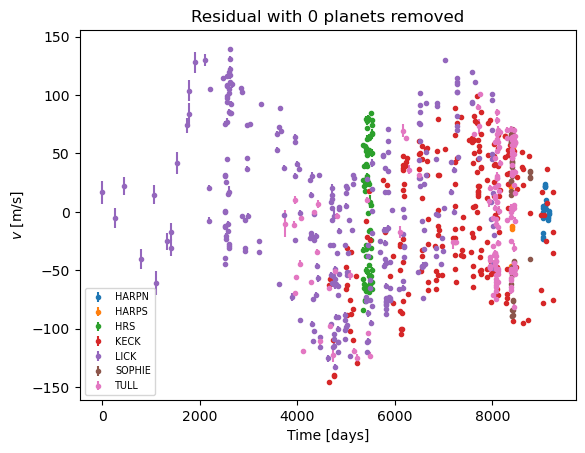

0.0
0.1
0.2
0.4
0.8
Bootstrap took 114.49839782714844 s for 10000 iterations


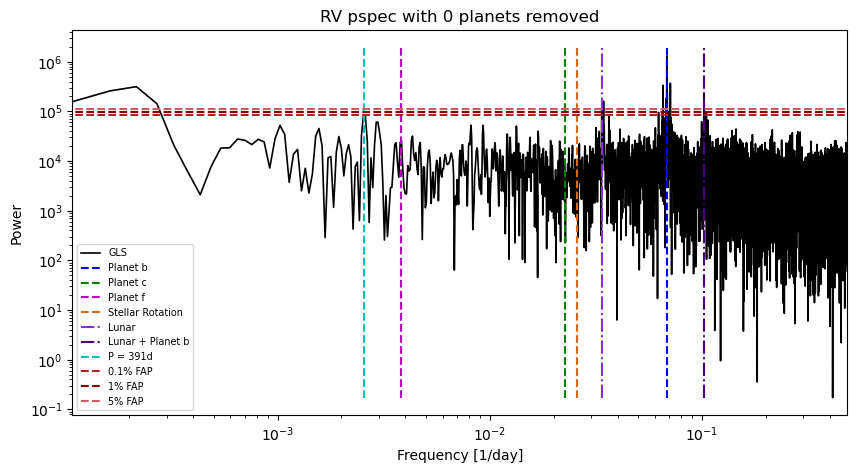

Removing orbit of P=14.653140000000002 d 

Fitting model parameters: 
Parameter                        Value     Error       
lin.offset_inst_HARPN       27440.5723  ±  0.0503      
lin.offset_inst_HARPS       27479.3079  ±  0.0608      
lin.offset_inst_HRS          28357.591  ±  0.226       
lin.offset_inst_KECK          -23.7175  ±  0.0448      
lin.offset_inst_LICK            4.7905  ±  0.0926      
lin.offset_inst_SOPHIE      27449.1494  ±  0.0995      
lin.offset_inst_TULL        -22558.505  ±  0.164       
kep.0.P                     14.6523452  ±  0.0000153   
kep.0.la0 [deg]                336.564  ±  0.204       
kep.0.K                        69.4968  ±  0.0449      
kep.0.e                       0.023049  ±  0.000541    
kep.0.w [deg]                   203.78  ±  1.33        

loglikelihood = -262917.29213645123



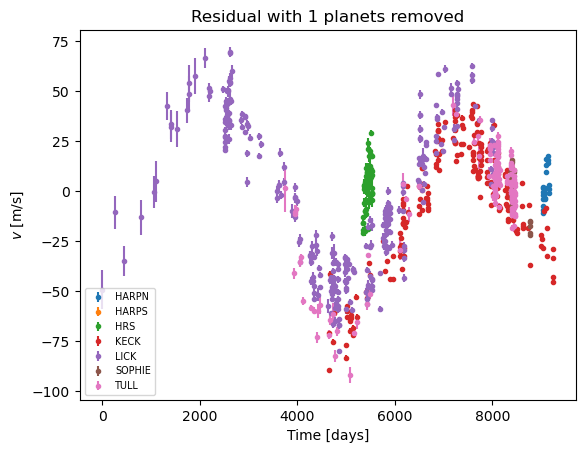

0.0
0.1
0.2
0.4
0.8
Bootstrap took 110.89877390861511 s for 10000 iterations


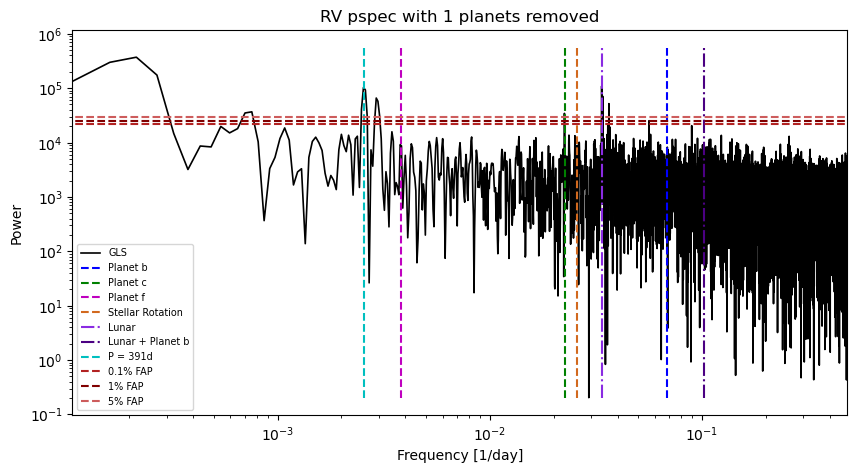

Removing orbit of P=44.373 d 

Fitting model parameters: 
Parameter                        Value     Error       
lin.offset_inst_HARPN        27444.636  ±  0.119       
lin.offset_inst_HARPS       27478.4958  ±  0.0821      
lin.offset_inst_HRS          28356.379  ±  0.231       
lin.offset_inst_KECK          -23.2234  ±  0.0575      
lin.offset_inst_LICK             4.520  ±  0.101       
lin.offset_inst_SOPHIE       27446.327  ±  0.101       
lin.offset_inst_TULL        -22557.963  ±  0.164       
kep.0.P                     14.6517643  ±  0.0000199   
kep.0.la0 [deg]                329.838  ±  0.259       
kep.0.K                        68.7014  ±  0.0481      
kep.0.e                       0.018235  ±  0.000569    
kep.0.w [deg]                   114.89  ±  2.37        
kep.1.P                       44.36852  ±  0.00368     
kep.1.la0 [deg]                 318.35  ±  5.45        
kep.1.K                        10.7063  ±  0.0665      
kep.1.e                         0.3585  ±  0.0

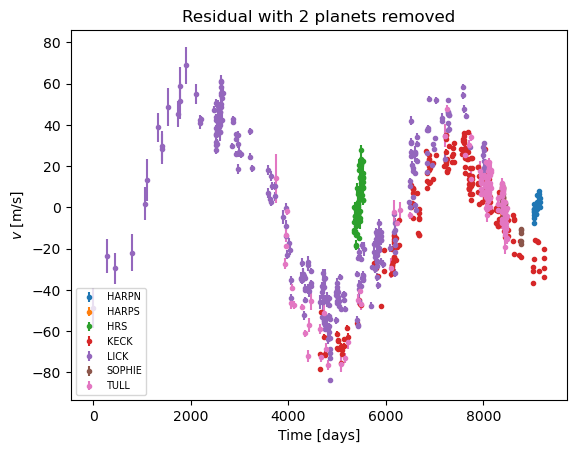

0.0
0.1
0.2
0.4
0.8
Bootstrap took 113.1403226852417 s for 10000 iterations


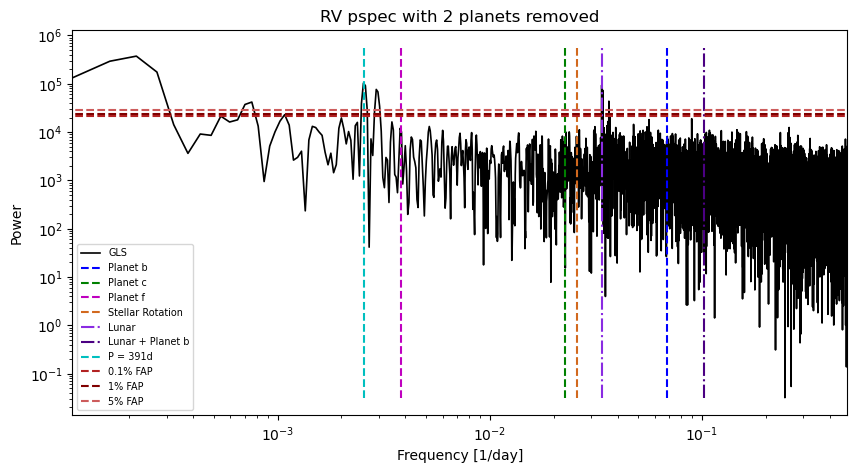

Removing orbit of P=260.91 d 

Fitting model parameters: 


/home/justin/anaconda3/envs/freshstart/lib/python3.10/site-packages/kepmodel/timeseries.py:716: RuntimeWarning: invalid value encountered in sqrt
  error = np.sqrt(-np.diag(np.linalg.inv(hess)))


Parameter                        Value     Error       
lin.offset_inst_HARPN       27447.2918  ±  0.0632      
lin.offset_inst_HARPS       27475.3913  ±  0.0694      
lin.offset_inst_HRS          28357.348  ±  0.227       
lin.offset_inst_KECK          -22.5203  ±  0.0437      
lin.offset_inst_LICK            4.0621  ±  0.0930      
lin.offset_inst_SOPHIE       27443.449  ±  0.102       
lin.offset_inst_TULL        -22557.678  ±  0.164       
kep.0.P                     14.6516854  ±  0.0000158   
kep.0.la0 [deg]                327.377  ±  0.207       
kep.0.K                        68.8336  ±  0.0462      
kep.0.e                       0.024540  ±  0.000552    
kep.0.w [deg]                   128.31  ±  1.33        
kep.1.P                       44.46008  ±  0.00104     
kep.1.la0 [deg]                  94.44  ±  1.52        
kep.1.K                        10.2263  ±  0.0404      
kep.1.e                        0.18287  ±  0.00365     
kep.1.w [deg]                   141.14  ±  1.28 

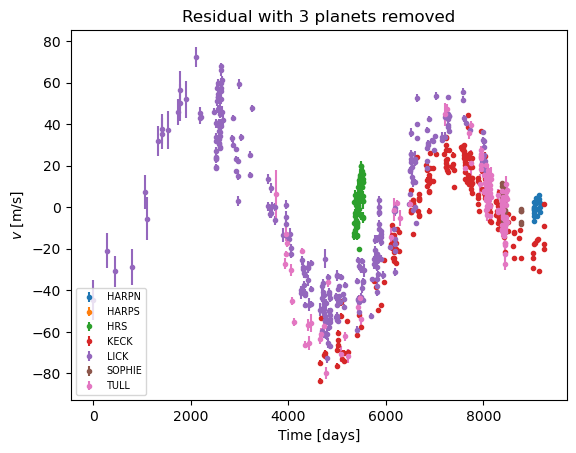

0.0
0.1
0.2
0.4
0.8
Bootstrap took 109.38075351715088 s for 10000 iterations


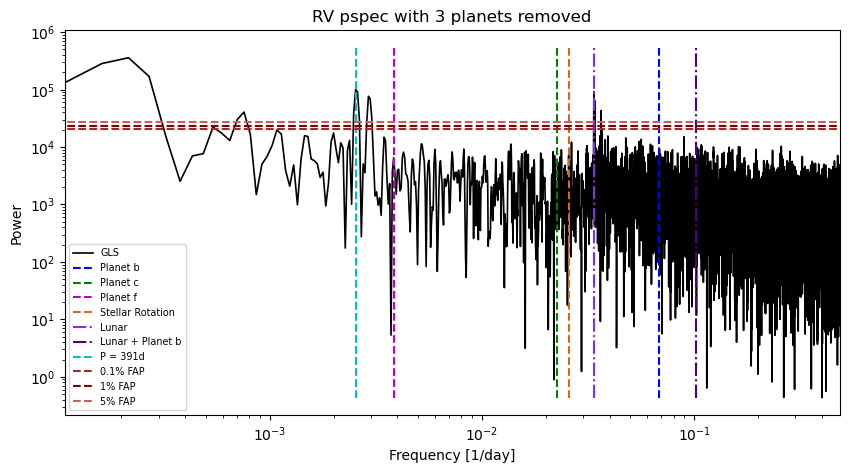

Removing orbit of P=0.7365478 d 

Fitting model parameters: 
Parameter                        Value     Error       
lin.offset_inst_HARPN       27445.4842  ±  0.0694      
lin.offset_inst_HARPS       27473.4502  ±  0.0766      
lin.offset_inst_HRS          28357.368  ±  0.227       
lin.offset_inst_KECK          -22.4317  ±  0.0439      
lin.offset_inst_LICK            3.7851  ±  0.0933      
lin.offset_inst_SOPHIE       27441.565  ±  0.107       
lin.offset_inst_TULL        -22557.928  ±  0.165       
kep.0.P                     14.6517655  ±  0.0000159   
kep.0.la0 [deg]                328.531  ±  0.209       
kep.0.K                        69.0084  ±  0.0464      
kep.0.e                       0.025377  ±  0.000551    
kep.0.w [deg]                   129.28  ±  1.28        
kep.1.P                       44.45957  ±  0.00103     
kep.1.la0 [deg]                  93.70  ±  1.50        
kep.1.K                        10.3062  ±  0.0403      
kep.1.e                        0.17643  ±  

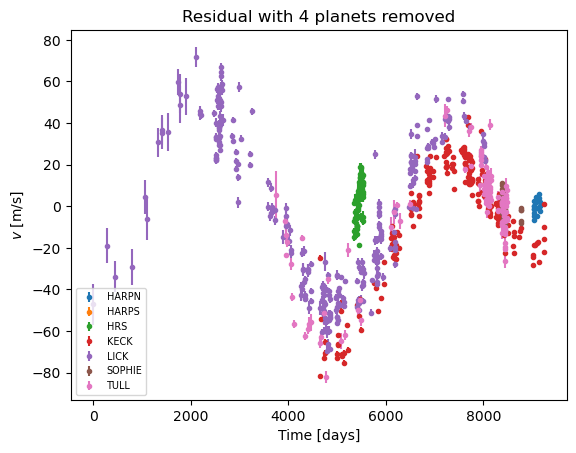

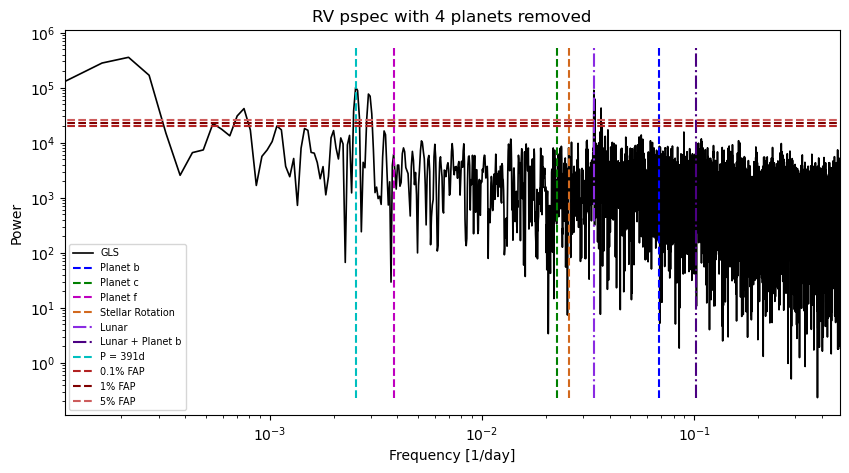

LR cutoff for significance:  15.08627246938899
	 ~~ 55Cnc No Jitter ~~ 
loglike :  [-262917.29213645 -221290.61866872 -205447.72045529 -201799.8330196 ] 
LR =  [83253.34693547 31685.79642685  7295.77487138] 

p-values:  [0. 0. 0.] 

Bayesian information criterion:  [526014.4543509  442761.10741543 411075.31098858]


In [7]:
model_4pGP, res, loglike, LR, p_val = remove_kep_without_jitter(rv_dict, rv_model, [planet_b, planet_c, planet_f, planet_e], fit_param = True) # planet_d taken out

In [8]:
time = rv_dict['jd'] - rv_dict['jd'][0]; RV = RV_Bourrier; RVerr = RVerr_Bourrier 
unif_time = np.linspace(time[0], np.max(time), round(len(time)/3)) # Reducing GP sample cadence for compute time
kep_model = model_4pGP
N_param = len(rv_model.get_param())

metric_guess = 17.0 
gamma_guess = 1.0 
period_guess = np.exp(8.55) 

# Set reasonable boundaries for each hyperparameter
# Parameter order: ln(amplitude), ln(metric^2), gamma, ln(period)
GP_lower_bounds = [0.5, np.log(2000.0**2), 0.01, np.log(1500.0)]  
GP_upper_bounds = [5.8, 22.0, 10.0, 8.8] 
model_values = np.array(kep_model.get_param())
model_errors = np.array(kep_model.get_param_error()[1])

# Fix the NaN in uncertanties to Bourrier published value
model_errors[N_param-5] = 1.3*10**(-6) 

# Vastly increasing parameter error bars to allow GP to explore more space
kep_lower_bounds = model_values - 1000.0*model_errors 
kep_upper_bounds = model_values + 1000.0*model_errors

for p in range(4):
    kep_lower_bounds[7 + int(5*p) + 1] = 0.0 # Mean longitude
    kep_lower_bounds[7 + int(5*p) + 3] = 0.0 # eccentricity
    kep_lower_bounds[7 + int(5*p) + 4] = 0.0 # argument of periastron
    
    kep_upper_bounds[7 + int(5*p) + 1] = 360.0 # Mean longitude
    kep_upper_bounds[7 + int(5*p) + 3] = 0.7 # eccentricity
    kep_upper_bounds[7 + int(5*p) + 4] = 360.0 # argument of periastron

# Fix amplitude bounds 
kep_lower_bounds[16-7] = 50.0; kep_upper_bounds[16-7] = 80.0 # Amplitude of planet b
kep_lower_bounds[21-7] = 2.0; kep_upper_bounds[21-7] = 20.0 # Amplitude of planet c
kep_lower_bounds[26-7] = 2.0; kep_upper_bounds[26-7] = 20.0 # Amplitude of planet f
kep_lower_bounds[26-9] = 200.0; kep_upper_bounds[26-9] = 300.0 # Period of planet f
kep_lower_bounds[31-7] = 2.0; kep_upper_bounds[31-7] = 20.0 # Amplitude of planet e

par_bounds = Bounds(combine_kep_GP_params(kep_lower_bounds, GP_lower_bounds), combine_kep_GP_params(kep_upper_bounds, GP_upper_bounds))
    
k_exp2 = np.std(kep_model.residuals()) * kernels.ExpSquaredKernel(metric = metric_guess) 
k_per = kernels.ExpSine2Kernel(gamma = gamma_guess, log_period = np.log(period_guess))
k_mag = k_exp2 * k_per

# The below guess parameters are prior MCMC results
guess_pars_no_jitter = [ 2.74593149e+04,  2.74735295e+04,  2.84020578e+04, -3.49661346e+01,
        8.70454913e+00,  2.74434876e+04, -2.25657971e+04,  1.46515426e+01,
        5.70301649e+00,  7.12587763e+01,  8.19261292e-04,  1.07291191e+01,
        4.44028319e+01,  1.75853994e-01,  9.72565737e+00,  3.52274641e-02,
        6.53886270e+00,  2.59836810e+02,  5.09250798e+00,  5.19292021e+00,
        2.36270506e-01,  5.35101354e+00,  7.36548143e-01,  1.94961634e+00,
        6.02062974e+00,  3.28863413e-02,  2.06037193e+00,  3.88512192e+00,
        1.68154242e+01,  3.51459936e+00,  8.48215260e+00]

gp_irregular = george.GP(k_mag, mean = np.mean(kep_model.residuals()), fit_kernel = True)
gp_irregular.set_parameter_vector(guess_pars_no_jitter[len(guess_pars_no_jitter)-4:]) 
gp_irregular.compute(time, RVerr)

Below is my previous best-fit GP for the 4 planet model, with parameter bounds shown

In [9]:
for i in range(len(kep_lower_bounds)):
    print("Min | Initial Value | Max : ", kep_lower_bounds[i], "|", guess_pars_no_jitter[i], "|", kep_upper_bounds[i])

Min | Initial Value | Max :  27376.103656365176 | 27459.3149 | 27514.864773356003
Min | Initial Value | Max :  27396.812193269863 | 27473.5295 | 27550.088114288286
Min | Initial Value | Max :  28130.564481559137 | 28402.0578 | 28584.170534191668
Min | Initial Value | Max :  -66.37011899891564 | -34.9661346 | 21.50674153999736
Min | Initial Value | Max :  -89.50691533392937 | 8.70454913 | 97.07705377017139
Min | Initial Value | Max :  27334.35198184684 | 27443.4876 | 27548.7787044253
Min | Initial Value | Max :  -22722.647317455543 | -22565.7971 | -22393.20840050865
Min | Initial Value | Max :  14.635894046000992 | 14.6515426 | 14.66763700830241
Min | Initial Value | Max :  0.0 | 5.70301649 | 360.0
Min | Initial Value | Max :  50.0 | 71.2587763 | 80.0
Min | Initial Value | Max :  0.0 | 0.000819261292 | 0.7
Min | Initial Value | Max :  0.0 | 10.7291191 | 360.0
Min | Initial Value | Max :  43.43456759545701 | 44.4028319 | 45.48457583405187
Min | Initial Value | Max :  0.0 | 0.175853994 | 

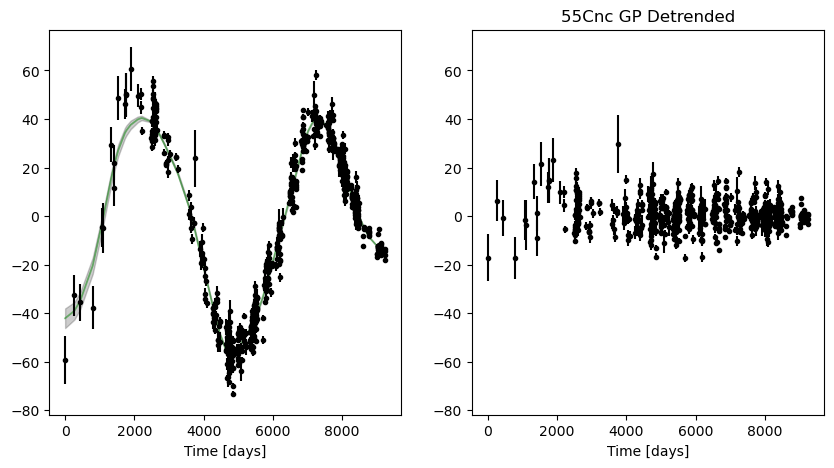

Fitted GP period [days]:  4827.831108808394
GP decor. timescale [days]:  4481.4955597435755
Fitted GP amplitude [m/s]:  48.67287629483433


In [10]:
kep_model.set_param(guess_pars_no_jitter[0:len(guess_pars_no_jitter)-4])

gp_irregular.set_parameter_vector(guess_pars_no_jitter[len(guess_pars_no_jitter)-4:]) 
gp_irregular.compute(time, RVerr)

t_GP_TEST, GP_fit_TEST = plot_GP(gp_irregular, gp_irregular.get_parameter_vector(), time, kep_model.residuals(), RVerr)

print("Fitted GP period [days]: ", np.exp(guess_pars_no_jitter[len(guess_pars_no_jitter)-1]))
print("GP decor. timescale [days]: ", np.sqrt(np.exp(guess_pars_no_jitter[len(guess_pars_no_jitter)-3])) ) 
print("Fitted GP amplitude [m/s]: ", np.exp(guess_pars_no_jitter[len(guess_pars_no_jitter)-4]))

# The GP Model 

To model stellar activity, we construct a quasiperiodic GP kernel as informed by Equation 27 from Rajpaul et al. (2015):
\begin{equation}
    k_{\text{QP}}(t_i, t_j) = K^2 \text{exp}\Bigg\{ - \frac{ \sin^2{[\pi(t_i - t_j)/P]}}{2 \lambda_p^2} - \frac{(t_i - t_j)^2}{2 \lambda_e^2}  \Bigg\} , 
\label{eq:GP_ker}
\end{equation}
where $K$ is the amplitude, $P$ is the period of oscillation, $\lambda_p$ is the dimensionless length scale of periodic variation, and $\lambda_e$ is an evolutionary time scale in the units of $t$. The first term captures periodic variation through the non-stationary exponential-sine-squared kernel and amplitude modulation though the stationary exponential-squared kernel. 

Our model fitting is through a curvature-penalized likelihood function $\mathcal{L}(\boldsymbol{\theta})$ given input parameters $\boldsymbol{\theta}$:
\begin{equation}
\mathcal{L}(\boldsymbol{\theta}) = -\frac{1}{2} \sum^{N-1}_{n = 0}  \frac{(\Delta y_n - \tau_n)^2}{\sigma_{y, n}^2}  - \frac{1}{2} \alpha \sum^{M}_{m = 1} \Bigg( \frac{\tau_{m+1} - 2\tau_m + \tau_{m-1}}{\Delta t_{\text{GP}}^2} \Bigg)^2
\end{equation}
where $\Delta y_n$ is the Keplerian residual and $\tau_n$ is the stellar activity induced Doppler shift predicted by $k_{\text{QP}}$ at time $t_n$. $\alpha$ dictates the degree to which GP curvature is penalized.

# Try Nelder-Mead using curvature-penalized NLL 
You can play around with Nelder-Mead optimization using the code below. We ultimately ran both Nelder-Mead and MCMC code on the University of Delaware Caviness computing cluster. The MCMC script can be found in the main repository branch, and is appropriately labeled.

In [11]:
par_bounds = Bounds(combine_kep_GP_params(kep_lower_bounds, GP_lower_bounds), combine_kep_GP_params(kep_upper_bounds, GP_upper_bounds))

alpha = 2.0e8 
def penalized_NLL(all_params):
    kep_params, GP_params = split_kep_gp(all_params)
    kep_model.set_param(kep_params)
    kepres = kep_model.residuals() # Update residual 
    gp_irregular.set_parameter_vector(GP_params)    

    # Compute mean GP prediction
    GP_pred_unif, pred_var_unif = gp_irregular.predict(kepres, unif_time, return_var = True) 
    GP_pred_irregular, pred_var_irregular = gp_irregular.predict(kepres, time, return_var = True)
    
    deriv_sum = (second_deriv(unif_time, GP_pred_unif)**2).sum()
    obj = -0.5*((kepres-GP_pred_irregular)**2/RVerr_Bourrier**2).sum() - 0.5*alpha*deriv_sum
    return -obj if np.isfinite(obj) else 1e25

def penalized_NLL_PRINTMODE(all_params): # Same as above, just prints out the values of the two terms in the obj func
    kep_params, GP_params = split_kep_gp(all_params)
    kep_model.set_param(kep_params)
    kepres = kep_model.residuals() # Update residual 
    gp_irregular.set_parameter_vector(GP_params)    

    # Compute mean GP prediction
    GP_pred_unif, pred_var_unif = gp_irregular.predict(kepres, unif_time, return_var = True) 
    GP_pred_irregular, pred_var_irregular = gp_irregular.predict(kepres, time, return_var = True)
    
    deriv_sum = (second_deriv(unif_time, GP_pred_unif)**2).sum()
    obj = -0.5*((kepres-GP_pred_irregular)**2/RVerr_Bourrier**2).sum() - 0.5*alpha*deriv_sum
    
    print("LSQ term = ", -0.5*((kepres-GP_pred_irregular)**2/RVerr_Bourrier**2).sum())
    print("Curvature term = ", - 0.5*alpha*deriv_sum)
    print("alpha = ", alpha)
    return -obj if np.isfinite(obj) else 1e25

print("\nBeginning O(p) =  {0:.2f}".format(penalized_NLL(guess_pars_no_jitter)))
print("LAST RUN GP params: ")
print("Fitted GP period [days]: ", np.exp(guess_pars_no_jitter[len(guess_pars_no_jitter)-1]))
print("GP decor. timescale [days]: ", np.sqrt(np.exp(guess_pars_no_jitter[len(guess_pars_no_jitter)-3])) ) 
print("Fitted GP amplitude [m/s]: ", np.exp(guess_pars_no_jitter[len(guess_pars_no_jitter)-4]))
optimize = False
if optimize:
    print(penalized_NLL_PRINTMODE(guess_pars_no_jitter))
    start = timer.time()
    result = minimize(penalized_NLL,  guess_pars_no_jitter, method="Nelder-Mead", bounds = par_bounds, 
                          options = {'disp': True, 'maxfev': 2000})
    end = timer.time()
    print("Optimization took ", (end-start)/60.0, "min")
    print("\nFinal O(p) =  {0:.2f}".format(penalized_NLL(result.x)))
    print(penalized_NLL_PRINTMODE(result.x))

    print("=========Optimized Parameters=========\n", result.x)
    print("Fitted GP period [days]: ", np.exp(result.x[len(result.x)-1]))
    print("GP decor. timescale [days]: ", np.sqrt(np.exp(result.x[len(result.x)-3])) ) 
    print("Fitted GP amplitude [m/s]: ", np.exp(result.x[len(result.x)-4]))
    print("Success?: ", result.success)
    #print(result.x)


Beginning O(p) =  6188.86
LAST RUN GP params: 
Fitted GP period [days]:  4827.831108808394
GP decor. timescale [days]:  4481.4955597435755
Fitted GP amplitude [m/s]:  48.67287629483433


# MCMC results 
We computed MCMC results using the University of Delaware Caviness cluster, and simply read in the resulting chains for further analysis. See "55Cnc_4pGP_MCMC_alpha_2e8_final.py" for the MCMC code. 

In [12]:
#chains_1e8_newamp = np.loadtxt('caviness/55Cnc_4pGP_MCMC_chains_alpha_100000000_newamp.txt')
chains_2e8_newamp = np.loadtxt('caviness/55Cnc_4pGP_MCMC_chains_alpha_200000000_newamp.txt')
#chains_3e8_newamp = np.loadtxt('caviness/55Cnc_4pGP_MCMC_chains_alpha_300000000_newamp.txt')
#chains_4e8_newamp = np.loadtxt('caviness/55Cnc_4pGP_MCMC_chains_alpha_400000000_newamp.txt')
#chains_5e8_newamp = np.loadtxt('caviness/55Cnc_4pGP_MCMC_chains_alpha_500000000_newamp.txt')

Below are some GP fits for different values of $\alpha$, predicting onto the RV residual with all (4) Keplerians removed. 

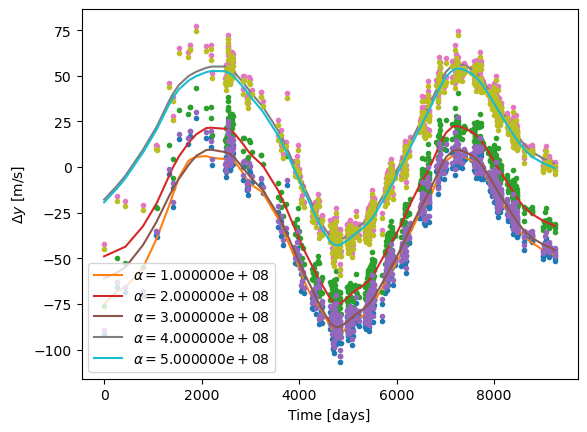

In [13]:
params_1e8_newamp = np.loadtxt('caviness/55Cnc_4pGP_MCMC_param_alpha_100000000_newamp.txt')
params_2e8_newamp = np.loadtxt('caviness/55Cnc_4pGP_MCMC_param_alpha_200000000_newamp.txt')
params_3e8_newamp = np.loadtxt('caviness/55Cnc_4pGP_MCMC_param_alpha_300000000_newamp.txt')
params_4e8_newamp = np.loadtxt('caviness/55Cnc_4pGP_MCMC_param_alpha_400000000_newamp.txt')
params_5e8_newamp = np.loadtxt('caviness/55Cnc_4pGP_MCMC_param_alpha_500000000_newamp.txt')

test_alphas = [1.0e8, 2.0e8, 3.0e8, 4.0e8, 5.0e8]
GP_test_params = {}
GP_test_params['0'] = params_1e8_newamp[len(params_1e8_newamp)-4:]
GP_test_params['1'] = params_2e8_newamp[len(params_2e8_newamp)-4:]
GP_test_params['2'] = params_3e8_newamp[len(params_3e8_newamp)-4:]
GP_test_params['3'] = params_4e8_newamp[len(params_4e8_newamp)-4:]
GP_test_params['4'] = params_5e8_newamp[len(params_5e8_newamp)-4:]

kep_test_params = {}
kep_test_params['0'] = params_1e8_newamp[0:len(params_1e8_newamp)-4]
kep_test_params['1'] = params_2e8_newamp[0:len(params_2e8_newamp)-4]
kep_test_params['2'] = params_3e8_newamp[0:len(params_3e8_newamp)-4]
kep_test_params['3'] = params_4e8_newamp[0:len(params_4e8_newamp)-4]
kep_test_params['4'] = params_5e8_newamp[0:len(params_5e8_newamp)-4]

for i in range(len(test_alphas)):   
    kep_model.set_param(kep_test_params[str(i)])
    gp_irregular.set_parameter_vector(GP_test_params[str(i)])
    GP_fit, pred_var = gp_irregular.predict(kep_model.residuals(), time, return_var = True)
    plt.plot(time, kep_model.residuals(), '.')
    plt.plot(time, GP_fit, '-', label = "$\u03B1 = {0:e}$".format(test_alphas[i]))
    plt.legend(loc = 0)
    
plt.ylabel("$\Delta y$"+" [m/s]")
plt.xlabel("Time [days]")
plt.show(); plt.close()

Let's investigate the MCMC results for the curvature penalty we end up using for this model: $\alpha = 2\cdot10^8$.

Maximum IAT: 1074.2264058755236
Effective Number of Samples per param: [467.87200748 467.80273936 470.27262805 467.20813674 467.24713687
 467.83101207 467.52476596 587.82639001 588.91472706 467.83121324
 352.35661799 248.24189625 499.90657008 508.70134175 466.64559671
 478.45157523 417.59473334 444.79518115 455.31773045 516.14816252
 497.17521014 459.57971149 527.53264795 504.97934081 496.84474471
 405.47915961 521.10269089 355.57244377 419.08067267 377.11425257
 432.16833979]
Mean ESS:  461.45546376468815
Minimum ESS:  248.2418962533865


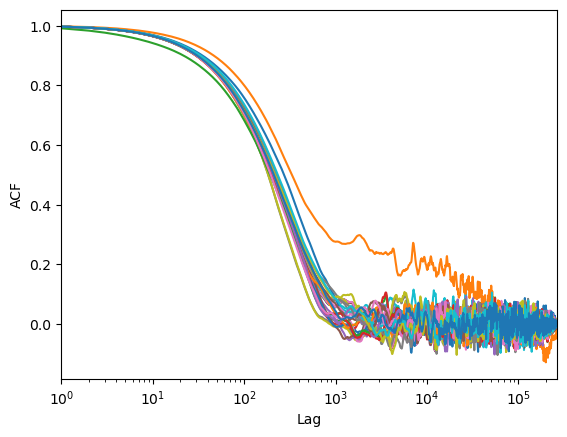

In [14]:
nsamples = 400000 
alpha = 2.0e8
samples = chains_2e8_newamp.reshape((nsamples+1, 4*5+7+4)) # 20 kep params, 7 inst offsets, 4 GP params

burn = nsamples//3
R = acf.acf(samples[burn:, :])
tau = np.arange(R.shape[0])
plt.figure()
plt.plot(tau[1:], R[1:])
plt.xscale('log')
plt.xlim(1, tau[-1])
plt.xlabel('Lag')
plt.ylabel('ACF')
iat = acf.iat(R=R)
iat_max = np.max(acf.iat(R=R))
ESS = R.shape[0]/iat

print('Maximum IAT:', iat_max) # Time needed for chain to forget where it started
print('Effective Number of Samples per param:', ESS) # N/iat
print("Mean ESS: ", np.mean(ESS))
print("Minimum ESS: ", np.min(ESS))

In [15]:
# Set up labels for corner plots
corner_labels = ["HARPN "+"$\Delta v$", "HARPS "+"$\Delta v$", "HRS "+"$\Delta v$", "KECK "+"$\Delta v$", "LICK "+"$\Delta v$", "SOPHIE "+"$\Delta v$", "TULL "+"$\Delta v$"]#,
for p in range(4): 
    if p==0:
        corner_labels.append("(B) "+"$P$") 
        corner_labels.append("(B) "+"$L_0$")
        corner_labels.append("(B) "+"$K$")
        corner_labels.append("(B) "+"$e$")
        corner_labels.append("(B) "+"$\omega$")
    elif p==1:
        corner_labels.append("(C) "+"$P$") 
        corner_labels.append("(C) "+"$L_0$")
        corner_labels.append("(C) "+"$K$")
        corner_labels.append("(C) "+"$e$")
        corner_labels.append("(C) "+"$\omega$")
    elif p==2:
        corner_labels.append("(F) "+"$P$") 
        corner_labels.append("(F) "+"$L_0$")
        corner_labels.append("(F) "+"$K$")
        corner_labels.append("(F) "+"$e$")
        corner_labels.append("(F) "+"$\omega$")       
    elif p==3:
        corner_labels.append("(E) "+"$P$") 
        corner_labels.append("(E) "+"$L_0$")
        corner_labels.append("(E) "+"$K$")
        corner_labels.append("(E) "+"$e$")
        corner_labels.append("(E) "+"$\omega$")
    
corner_labels.append("$\ln{(K)}$")
corner_labels.append("  $\ln{(\lambda_{e}^2)}$")
corner_labels.append("$1/2\lambda_{p}^2$")
corner_labels.append("  $P$")

Corner plot of only the instrumentation effects + a couple of planets. Due to the large parameter space, it's neccessary to break up these corner plots into smaller chuncks.

Burn-in:  133333


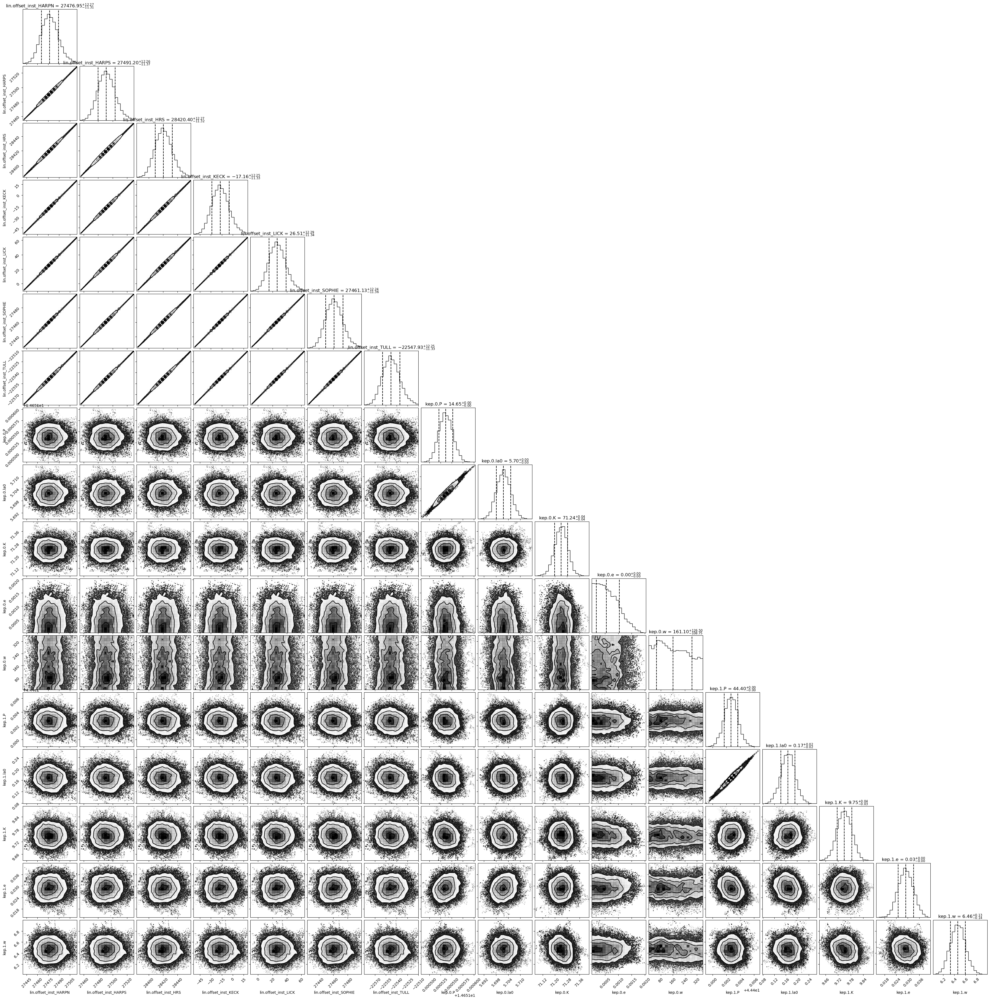

In [16]:
print("Burn-in: ", burn)
corner.corner(
    samples[burn:, 0:17], 
    labels=kep_model.fit_param[0:17], 
    quantiles=[0.159, 0.5, 0.841],
    show_titles=True)
plt.show()
plt.close()

Here are the remaining parameters not shown above

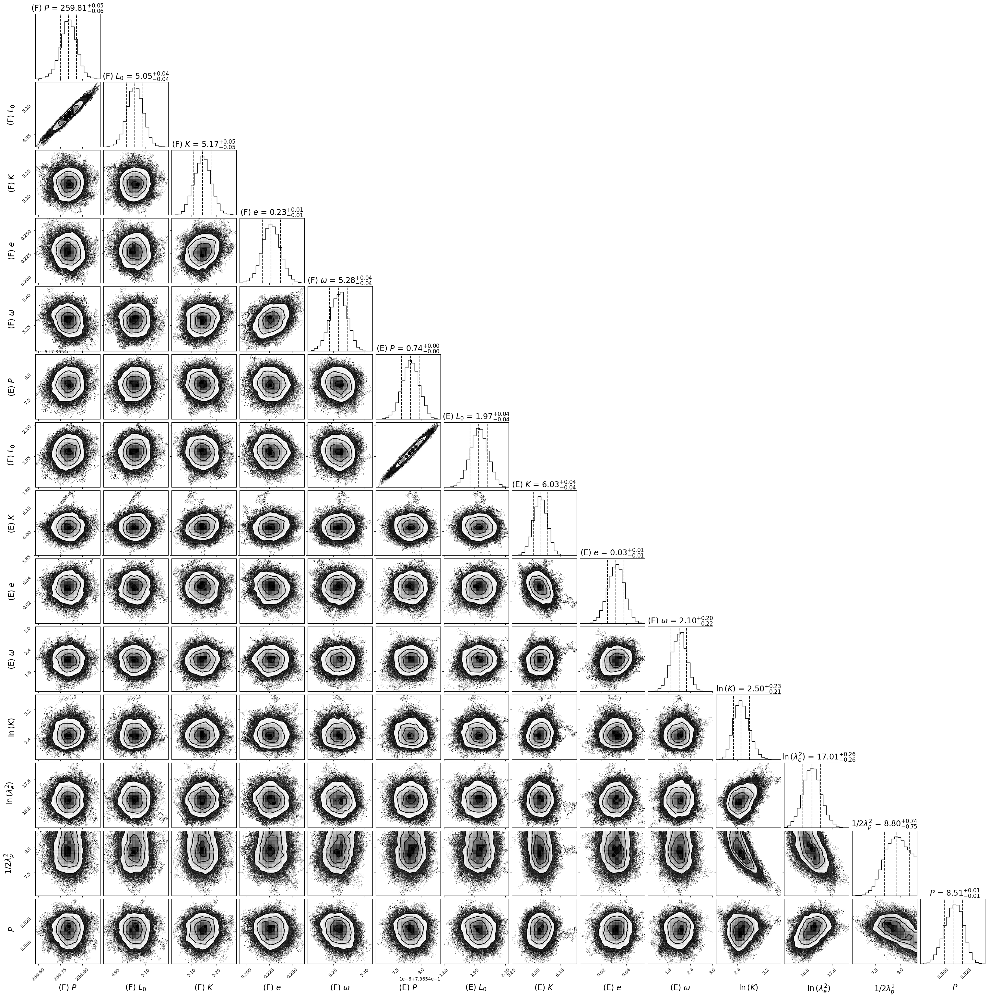

In [17]:
label_dict = {}; label_dict["fontsize"] = "xx-large"
title_kwargs = {}; title_kwargs["fontsize"] = "xx-large"
corner.corner(
    samples[burn:, 17:], 
    labels=corner_labels[17:],
    quantiles=[0.159, 0.5, 0.841],
    show_titles=True, max_n_ticks=3, label_kwargs = label_dict, title_kwargs = title_kwargs)
plt.show()
plt.close()

Let's zoom into the GP hyperparameter space. For the GP period $P$, we've converted from $\ln(P)$ to $P$ (in days) to aid intuition.

In [18]:
np.log(1./(2*10**2))

-5.298317366548036

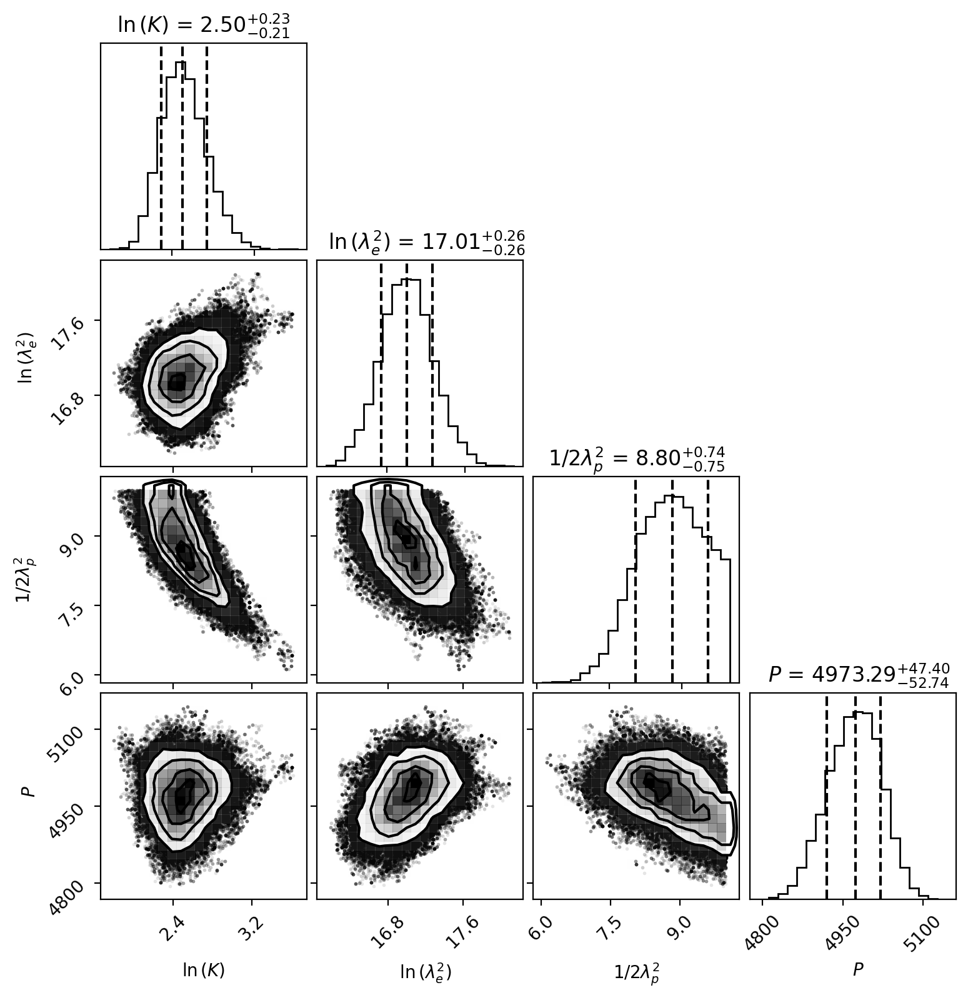

In [19]:
label_dict = {}; label_dict["fontsize"] = "xx-large"
title_kwargs = {}; title_kwargs["fontsize"] = "xx-large"

mod_samples = np.zeros(np.shape(samples[burn:, len(guess_pars_no_jitter)-4:]))
mod_samples[:, 0:3] = samples[burn:, len(guess_pars_no_jitter)-4:len(guess_pars_no_jitter)-1]
mod_samples[:, 3] = np.exp(samples[burn:, len(guess_pars_no_jitter)-1])

fig = plt.figure(figsize = (8, 8), dpi = 200) 
corner.corner(
    mod_samples, 
    labels=corner_labels[len(corner_labels)-4:],
    quantiles=[0.159, 0.5, 0.841],
    show_titles=True, max_n_ticks=3, fig = fig)
plt.show()
plt.close()

Some additional diagnostic plots:

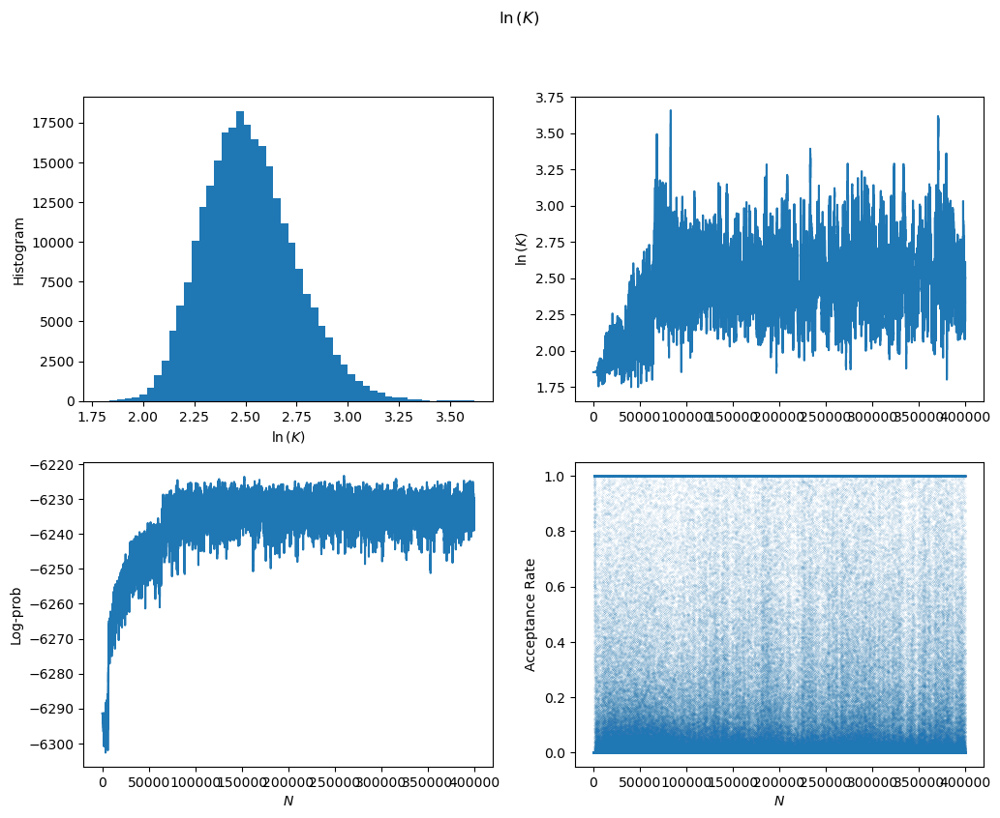

In [20]:
chain_prob = np.loadtxt('caviness/55Cnc_4pGP_MCMC_logprob_alpha_200000000_newamp.txt')
chain_accept = np.loadtxt('caviness/55Cnc_4pGP_MCMC_acceptrate_alpha_200000000_newamp.txt')

N_mcmc = np.arange(0, nsamples+1, 1)
param = len(guess_pars_no_jitter)-4 

fig, axes = plt.subplots(2, 2, sharex=False, figsize = (12, 9), dpi = 100.)   
fig.suptitle(corner_labels[param] )

axes[0, 0].hist(samples[burn:, param], bins = 50) 
axes[0, 0].set_ylabel("Histogram")
axes[0, 0].set_xlabel(corner_labels[param])
    
axes[0, 1].plot(N_mcmc[0:], samples[:, param]) 
axes[0, 1].set_ylabel(corner_labels[param])
    
axes[1, 0].plot(N_mcmc, chain_prob)
axes[1, 0].set_ylabel("Log-prob")
    
axes[1, 1].plot(N_mcmc[1:], chain_accept, '.', markersize=0.1)
axes[1, 1].set_ylabel("Acceptance Rate")
axes[1, 0].set_xlabel(r"$N$")
axes[1, 1].set_xlabel(r"$N$")
plt.show()

Our final model parameters from the MCMC posterior distributions:

In [21]:
# Obtain uncertanties using [0.159, 0.5, 0.841] quantiles on the MCMC chains
quantiles = np.zeros((np.shape(samples[0, :])[0], 3))
for i in range(np.shape(samples[0, :])[0]):
    quantiles[i, :] = corner.quantile(samples[burn:, i], [0.159, 0.5, 0.841], weights=None)
    print(i, ": ", quantiles[i, 1], "(+ ", quantiles[i, 2]-quantiles[i, 1], ") (- ", quantiles[i, 1]-quantiles[i, 0], ")")

0 :  27476.95064174451 (+  12.326556401974813 ) (-  11.358497651384823 )
1 :  27491.201097577825 (+  12.315983214975859 ) (-  11.404870869340812 )
2 :  28420.4013488898 (+  12.316408469650924 ) (-  11.352741539165436 )
3 :  -17.162584933014777 (+  12.306484843361456 ) (-  11.361635175295373 )
4 :  26.51177354902091 (+  12.342549715169746 ) (-  11.365302837844846 )
5 :  27461.129622468932 (+  12.29346367179096 ) (-  11.414459041487135 )
6 :  -22547.925644360148 (+  12.302274714365922 ) (-  11.36526669147861 )
7 :  14.651536741094686 (+  1.6055710911899723e-05 ) (-  1.545180202811025e-05 )
8 :  5.701649453201279 (+  0.0036021253143676546 ) (-  0.003481556136692099 )
9 :  71.24142735520753 (+  0.04099690765801256 ) (-  0.042652286587539834 )
10 :  0.0005521414353254759 (+  0.0004899055485480849 ) (-  0.0003795182576814578 )
11 :  161.10492678860538 (+  126.74048900683431 ) (-  109.82406727507424 )
12 :  44.40269468611599 (+  0.0009538768052195223 ) (-  0.000983787527438551 )
13 :  0.16789

Here is a quick plot of the final GP fit over the residual with all Keplerians removed.

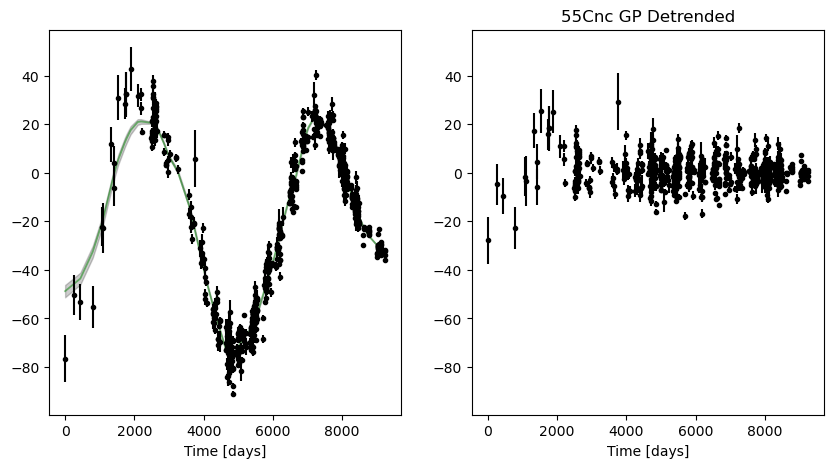

In [22]:
best_fit_params = quantiles[:, 1]

gp_irregular.set_parameter_vector(best_fit_params[len(best_fit_params)-4:])
kep_model.set_param(best_fit_params[0:len(best_fit_params)-4])
kep_res_final = kep_model.residuals()

t_GP_final, GP_fit_final = plot_GP(gp_irregular, gp_irregular.get_parameter_vector(), time, kep_res_final, RVerr_Bourrier)

Convert from the weird GP log-params to natural units

In [23]:
print("GP Amplitude [m/s]: ", np.exp(quantiles[len(quantiles)-4, 1]), "+", (np.exp(quantiles[len(quantiles)-4, 2])-np.exp(quantiles[len(quantiles)-4, 1])), "-", (np.exp(quantiles[len(quantiles)-4, 1])-np.exp(quantiles[len(quantiles)-4, 0])))
print("Decor. scale [days]: ", np.sqrt(np.exp(quantiles[len(quantiles)-3, 1])), "+", (np.sqrt(np.exp(quantiles[len(quantiles)-3, 2]))-np.sqrt(np.exp(quantiles[len(quantiles)-3, 1]))), "-", (np.sqrt(np.exp(quantiles[len(quantiles)-3, 1]))-np.sqrt(np.exp(quantiles[len(quantiles)-3, 0]))))
print("Length scale [-]: ", np.sqrt(1/(2*quantiles[len(quantiles)-2, 1])), "+", (np.sqrt(1/(2*quantiles[len(quantiles)-2, 2]))-np.sqrt(1/(2*quantiles[len(quantiles)-2, 1]))), "-", (np.sqrt(1/(2*quantiles[len(quantiles)-2, 1]))-np.sqrt(1/(2*quantiles[len(quantiles)-2, 0]))))
print("GP Period [days]: ", np.exp(quantiles[len(quantiles)-1, 1]), "+", (np.exp(quantiles[len(quantiles)-1, 2])-np.exp(quantiles[len(quantiles)-1, 1])), "-", (np.exp(quantiles[len(quantiles)-1, 1])-np.exp(quantiles[len(quantiles)-1, 0])))

GP Amplitude [m/s]:  12.23177491766775 + 3.2492449395411427 - 2.2770590665154717
Decor. scale [days]:  4928.048616128921 + 699.1497704829271 - 599.1502536793305
Length scale [-]:  0.23838957128645666 + -0.009470625404224609 - -0.010888660325215849
GP Period [days]:  4973.287053597006 + 47.55263628035664 - 52.92330121592022


In [24]:
# Compute planet masses using Lovis & Fischer (2010)
planet_names = ["55Cnc b", "55Cnc c", "55Cnc f", "55Cnc e"]
for p in range(4):
    P = quantiles[7+5*p, 1]
    sig_P = np.mean([quantiles[7+5*p, 2]-quantiles[7+5*p, 1], quantiles[7+5*p, 1]-quantiles[7+5*p, 0]])
    K_star = quantiles[9+5*p, 1]
    sig_K_star = np.mean([quantiles[9+5*p, 2]-quantiles[9+5*p, 1], quantiles[9+5*p, 1]-quantiles[9+5*p, 0]])
    e = quantiles[10+5*p, 1]
    sig_e = np.mean([quantiles[10+5*p, 2]-quantiles[10+5*p, 1], quantiles[10+5*p, 1]-quantiles[10+5*p, 0]])

    a = (P/365.25)**(2./3)
    sig_a = ((P+sig_P)/365.25)**(2./3) - ((P-sig_P)/365.25)**(2./3) 
    
    M_star = 0.905 # in solar masses, from von Braun et al (2011)
    sig_M_star = 0.015
    
    Msini = (K_star/28.4329)*np.sqrt(1-e**2)*(M_star**(2./3))*(P/365.25)**(1./3)
    sig_Msini = Msini*np.sqrt( (sig_K_star/K_star)**2 + (sig_e*e/(1-e**2))**2 +(4./9)*(sig_M_star/M_star)**2 
                              + (1./9)*(sig_P/P)**2)
    print(planet_names[p], ": P [d] = ", P, ", K [m/s] = ", K_star, ", e = ", e)
    print("Msini = ", Msini, "+/-", sig_Msini, ", a [AU] = ", a, "+/-", sig_a, "\n")

55Cnc b : P [d] =  14.651536741094686 , K [m/s] =  71.24142735520753 , e =  0.0005521414353254759
Msini =  0.8024933196226515 +/- 0.008879836476519272 , a [AU] =  0.11718228687846666 +/- 1.6799704974368446e-07 

55Cnc c : P [d] =  44.40269468611599 , K [m/s] =  9.749888030023365 , e =  0.028970348565464626
Msini =  0.1588674410179457 +/- 0.0018464487113372646 , a [AU] =  0.2454027367410036 +/- 7.139328419836222e-06 

55Cnc f : P [d] =  259.80543333771993 , K [m/s] =  5.165586705839109 , e =  0.22687330980024184
Msini =  0.1477776462479668 +/- 0.002222232834671737 , a [AU] =  0.7968416078547197 +/- 0.00022595522697643755 

55Cnc e : P [d] =  0.7365483744547395 , K [m/s] =  6.025743999926794 , e =  0.03165188101500585
Msini =  0.025038478392416914 +/- 0.00033022686879696534 , a [AU] =  0.01596151218708968 +/- 1.4990784238944066e-08 



# Let's visualize the final Keplerian and GP fits 

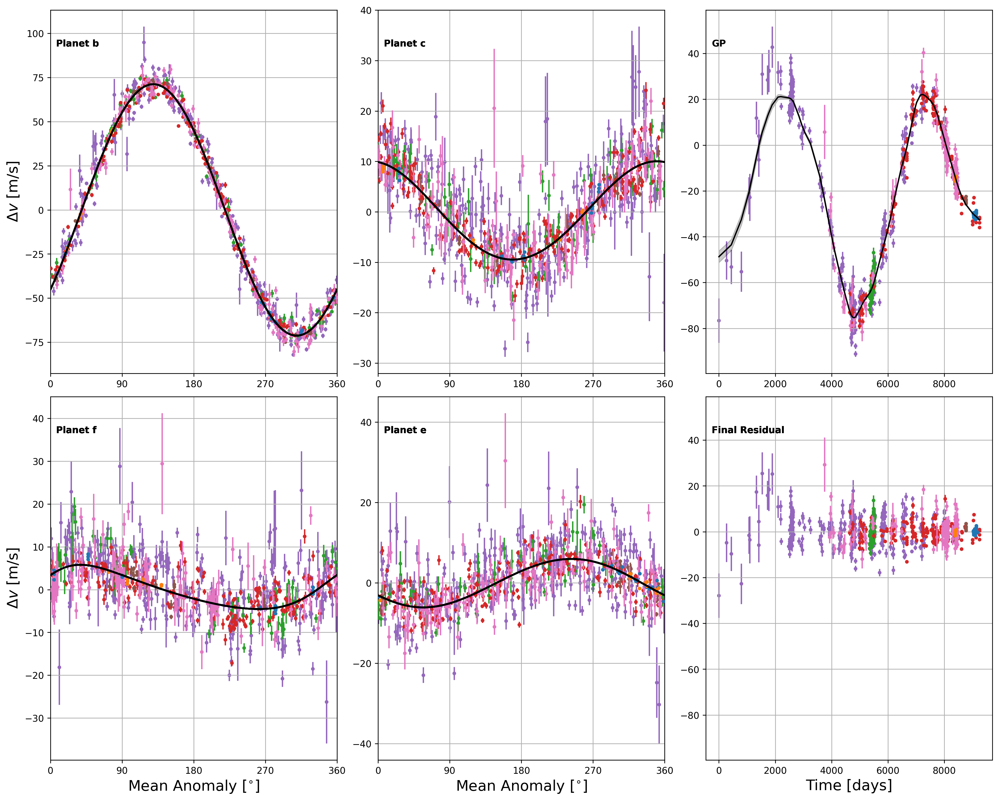

In [25]:
from matplotlib.gridspec import GridSpec

zorder_array = [8, 9, 4, 5, 0, 6, 7]
pred_GP_final, pred_var = gp_irregular.predict(kep_res_final, time, return_var = True)
res_final = kep_res_final - pred_GP_final

L = 1000 # Length of the Mmod array

kep_models = np.zeros((L, len(kep_model.keplerian)))
res_models = np.zeros((len(res), len(kep_model.keplerian)))
M_array = np.zeros((len(res), len(kep_model.keplerian)))
Mmod_array = np.zeros((L, len(kep_model.keplerian)))
n_array = np.zeros(len(kep_model.keplerian))

for name in kep_model.keplerian:
    kep = kep_model.keplerian[name]
    param = kep.get_param()
    kep_model.set_keplerian_param(name, param=['n', 'M0', 'K', 'ecosw', 'esinw'])
    n = kep_model.get_param(f'kep.{name}.n')
    M0 = kep_model.get_param(f'kep.{name}.M0')
    kep_model.set_keplerian_param(name, param=param)
    M = (M0 + n*kep_model.t)*180/np.pi % 360
    Mmod = np.linspace(0,360,L)
    tmod = (Mmod*np.pi/180-M0)/n

    M_array[:, int(name)] = M
    Mmod_array[:, int(name)] = Mmod
    kep_models[:, int(name)] = kep.rv(tmod)
    res_models[:, int(name)] = (res_final+kep.rv(kep_model.t))
    n_array[int(name)] = n

labels = ["Planet b", "Planet c", "Planet f", "Planet e"]
def format_axes(fig):
    for i, ax in enumerate(fig.axes):
        ax.text(0.5, 0.5, "ax%d" % (i+1), va="center", ha="center")
        ax.tick_params(labelbottom=False, labelleft=False)

fig = plt.figure(layout="constrained", figsize = (15, 12), dpi = 250.)

gs = GridSpec(2, 3, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, 0])
ax4 = fig.add_subplot(gs[1, 1])
ax5 = fig.add_subplot(gs[0, 2])
ax6 = fig.add_subplot(gs[1, 2])

axes = [ax1, ax2, ax3, ax4, ax5, ax6]
for i in range(len(axes)):
    for j in range(len(np.unique(instruments))): 
        inst = np.unique(instruments)[j]
        kinst = rv_dict['ins_name'] == inst
        if i <= 3:
            axes[i].errorbar(M_array[kinst, i], res_models[kinst, i], yerr=rv_err[kinst], fmt='.', zorder = zorder_array[j], label = inst, rasterized=True)
            axes[i].plot(Mmod_array[:, i], kep_models[:, i], 'k', lw=2, rasterized=True, zorder = 15)
            axes[i].set_xlim(0, 360)
            axes[i].text(0.02, 0.9, labels[i], transform=axes[i].transAxes, fontweight = 'bold') 
        elif i == 4: 
            axes[i].errorbar(time[kinst], kep_model.residuals()[kinst], yerr=rv_err[kinst], fmt='.', zorder = zorder_array[j], label = inst, rasterized=True)
        elif i == 5: 
            axes[i].errorbar(time[kinst], (kep_model.residuals()-GP_fit_final)[kinst], yerr=rv_err[kinst], fmt='.', zorder = zorder_array[j], label = inst, rasterized=True)
            axes[i].text(0.02, 0.9, 'Final Residual', transform=axes[i].transAxes, fontweight = 'bold') 
    axes[i].grid(visible=True, which='major', axis='both')
    
axes[4].fill_between(time, GP_fit_final - np.sqrt(pred_var), GP_fit_final + np.sqrt(pred_var),
                    color="k", alpha=0.2, zorder = 0)
axes[4].plot(t_GP_final, GP_fit_final, 'k-', label = "GP fit", zorder = 15)
axes[4].text(0.02, 0.9, "GP", transform=axes[4].transAxes, fontweight = 'bold') 

axes[5].set_ylim(axes[4].get_ylim())
axes[2].set_xlabel('Mean Anomaly [$^{\circ}$]', fontsize=16)
axes[3].set_xlabel('Mean Anomaly [$^{\circ}$]', fontsize=16)
axes[5].set_xlabel('Time [days]', fontsize=16)
axes[0].set_ylabel('$\Delta v$ [m/s]', fontsize=16)
axes[2].set_ylabel('$\Delta v$ [m/s]', fontsize=16)

axes[0].set_xticks([0,90,180,270,360], fontsize = 10, labels=None)
axes[1].set_xticks([0,90,180,270,360], fontsize = 10, labels=None)
axes[2].set_xticks([0,90,180,270,360], fontsize = 16)
axes[3].set_xticks([0,90,180,270,360], fontsize = 16)
axes[4].set_xticks([0,2000,4000,6000,8000], fontsize = 10, labels=None)
plt.show()
plt.close()

# Post-hoc Estimation of Jitter

Let $y_n$ denote the observed RV at time $t_n$ with reported uncertainty $\sigma_{y, n}$ and let $f(t_n)$ denote the total model prediction at $t_n$, including all Keplerians in addition to a quasiperiodic GP. We now define a normalized residual $\delta_y \equiv [y_n - f(t_n)]/\sigma_{y, n}$. For a well-fitted model $f(t)$ and well-estimated reported uncertaities $\sigma_{y, n}$, we expect $\delta_y$ to be a close approximation to a standard normal distribution $\mathcal{N}(0, 1)$. But we know the reported uncertainties $\sigma_{y, n}$ do not account for either instrumental or stellar jitter, so in reality our $\delta_y$ distribution will be significantly broader than $\mathcal{N}(0, 1)$. So let's first plot the distribution including all instruments.

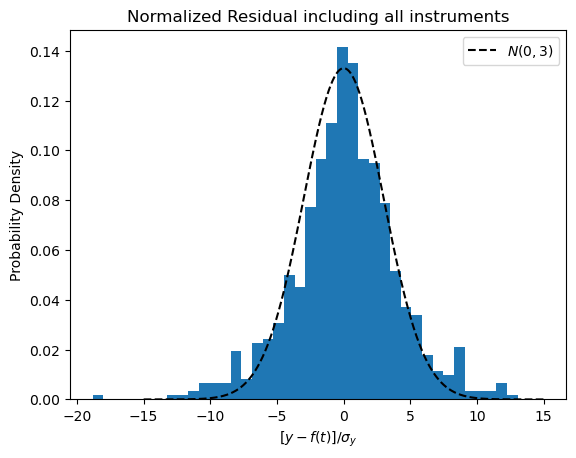

In [26]:
norm_res = res_final/RVerr_Bourrier

plt.hist(norm_res, bins = 40, density=True)
test_x = np.linspace(-15, 15, 1000)
plt.plot(test_x, norm.pdf(test_x, scale=3), 'k--', label = "$N(0, 3)$")
plt.xlabel("$[y-f(t)]/\sigma_y$")
plt.ylabel("Probability Density")
plt.title("Normalized Residual including all instruments")
plt.legend(loc = 0)
plt.show(); plt.close()

# A simple approximation for jitter
If jitter didn't exist, we would expect:
\begin{equation}
    \frac{1}{N-\gamma} \sum_{n=0}^{N-1} \Bigg(\frac{y_n - f(t_n)}{\sigma_{y, n}}\Bigg)^2 \approx 1, 
\end{equation}
where $N$ is the number of observations and $\gamma$ is the total number of parameters in the Keplerian+GP model $f(t)$. 
An approximation of jitter $\sigma_J$ could come from:
\begin{equation}
    \frac{1}{N-\gamma} \sum_{n=0}^{N-1} (y_n - f(t_n))^2 \approx \bar{\sigma_y^2} + \sigma_J^2,
\end{equation}
with
\begin{equation}
    \bar{\sigma_y^2} = \frac{1}{N} \sum_{n=0}^{N-1} \sigma_{y, n}^2 .
\end{equation}
We use this rough approximation for the instruments with only very few RV measurements. In these cases, we must further approximate $N-\gamma \approx N$. (Recall, $\gamma = 31$)

In [27]:
jitter_estimate = {}
for inst in np.unique(instruments):
    kinst = instruments == inst
    print(inst)
    MSE = (1./(len(res_final[kinst])))*((res_final[kinst]**2)).sum() 
    jitter_estimate[inst] = np.sqrt(MSE - np.mean(RVerr_Bourrier[kinst]**2))
    print("Jitter estimate [m/s]: ", jitter_estimate[inst]) 
    chi_test = (1./(len(res_final[kinst])))*((res_final[kinst]**2)/(RVerr_Bourrier[kinst]**2 + jitter_estimate[inst]**2)).sum() 
    print("Resulting mean Chi Sqr: ", chi_test)

HARPN
Jitter estimate [m/s]:  0.9793621262365012
Resulting mean Chi Sqr:  0.9696655813667742
HARPS
Jitter estimate [m/s]:  0.774863404781404
Resulting mean Chi Sqr:  1.035325710607814
HRS
Jitter estimate [m/s]:  3.909461748935521
Resulting mean Chi Sqr:  1.0651509569531332
KECK
Jitter estimate [m/s]:  3.4601937945896273
Resulting mean Chi Sqr:  0.9789403714622902
LICK
Jitter estimate [m/s]:  6.732324934354569
Resulting mean Chi Sqr:  0.8910574409940989
SOPHIE
Jitter estimate [m/s]:  1.97112767039028
Resulting mean Chi Sqr:  0.9980882077755576
TULL
Jitter estimate [m/s]:  4.66364111797701
Resulting mean Chi Sqr:  0.8577119384105822


In [28]:
for inst in np.unique(instruments):
    kinst = instruments == inst
    norm_res_inst = res_final[kinst]/RVerr_Bourrier[kinst]
    print("#of data points for ", inst, len(norm_res_inst))

#of data points for  HARPN 21
#of data points for  HARPS 12
#of data points for  HRS 63
#of data points for  KECK 216
#of data points for  LICK 290
#of data points for  SOPHIE 38
#of data points for  TULL 142


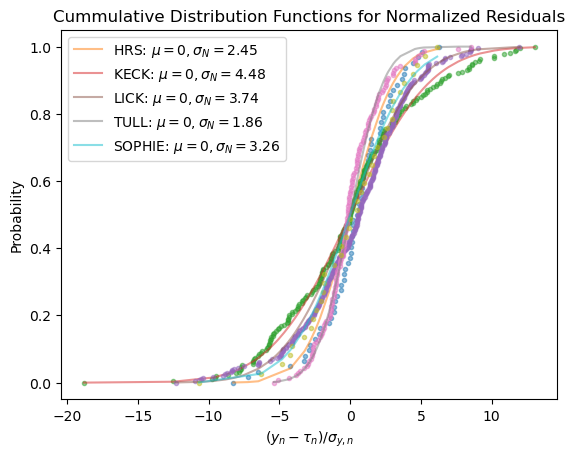

In [29]:
from scipy.stats import norm
from scipy.optimize import curve_fit

# forcing mean to be zero
def generate_CDF_mean0(x, sig):
    CDF = norm.cdf(x, loc = 0.0, scale=sig)
    return CDF

popt_cdf_mean0 = {}
for inst in ['HRS', 'KECK', 'LICK', 'TULL', 'SOPHIE']:
    kinst = instruments == inst

    vals_new = np.sort(res_final[kinst]/RVerr_Bourrier[kinst])
    y_CDF = np.linspace(0, 1, len(res_final[kinst])) 
    
    # Fit CDF to data
    popt, pcov = curve_fit(generate_CDF_mean0, vals_new, y_CDF, p0 = [3.0])
    popt_cdf_mean0[inst] = popt[0]
    
    plt.plot(vals_new, y_CDF, '.', alpha = 0.5, label = None)
    plt.plot(vals_new, generate_CDF_mean0(vals_new, popt[0]), alpha = 0.5, label = inst + ': $\mu={0:d}, \sigma_N={1:.2f}$'.format(0, popt[0]))

plt.xlabel('$(y_n - \\tau_{n})/ \sigma_{y, n}$')
plt.ylabel("Probability")
plt.title("Cummulative Distribution Functions for Normalized Residuals")
plt.legend(loc = 0)
plt.show()
plt.close()

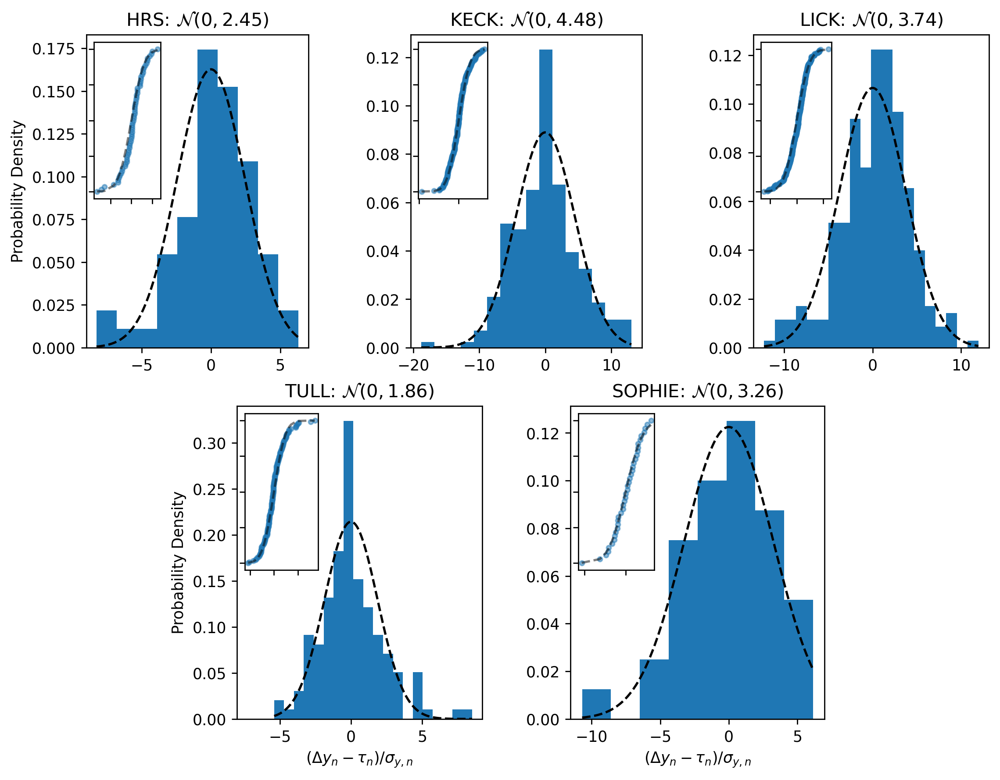

In [30]:
from matplotlib.gridspec import GridSpec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

fig = plt.figure(layout="constrained", figsize=[9, 7], dpi = 250)

gs = GridSpec(2, 6, figure=fig)
ax1 = fig.add_subplot(gs[0, 0:2])
ax2 = fig.add_subplot(gs[0, 2:4])
ax3 = fig.add_subplot(gs[0, 4:])
ax4 = fig.add_subplot(gs[1, 1:3])
ax5 = fig.add_subplot(gs[1, 3:5])

i = 0
bins_vec = [10, 16, 20, 20, 8]
inst_vec = ['HRS', 'KECK', 'LICK', 'TULL', 'SOPHIE']
for i, ax in enumerate(fig.axes):
    if i == 0 or i == 3:
        ax.set_ylabel("Probability Density")
    
    inst = inst_vec[i]
    kinst = instruments == inst
    norm_res_inst = res_final[kinst]/RVerr_Bourrier[kinst]
    
    test_x = np.linspace(np.min(norm_res_inst), np.max(norm_res_inst), 1000)

    axins = inset_axes(ax, width="30%", height="50%", loc='upper left')
    ax.hist(norm_res_inst, density=True, bins = bins_vec[i]) 
    ax.plot(test_x, norm.pdf(test_x, loc=0.0, scale=popt_cdf_mean0[inst]), 'k--', label = '$N({0:d}, {1:.2f})$'.format(0, popt_cdf_mean0[inst]))

    vals_new = np.sort(res_final[kinst]/RVerr_Bourrier[kinst])
    y_CDF = np.linspace(0, 1, len(res_final[kinst])) 
    
    axins.plot(vals_new, y_CDF, '.', alpha = 0.5)
    axins.plot(vals_new, generate_CDF_mean0(vals_new, popt_cdf_mean0[inst]), 'k--', alpha = 0.5)
    axins.tick_params(labelleft=False, labelbottom=False)
    
    if i == 3:
        ax.set_xlabel('$(\Delta y_n - \\tau_{n})/ \sigma_{y, n}$')
        ax.set_xlim(left = -8)

    ax.set_title(inst + ': '+r'$\mathcal{N}$'+'$({0:d},{1:.2f})$'.format(0, popt_cdf_mean0[inst]))
ax.set_xlabel('$(\Delta y_n - \\tau_{n})/ \sigma_{y, n}$')
plt.show()
plt.close()

The above distributions of normalized residuals evidently have variance $\sigma_N^2 > 1$, implying a total squared error $\sigma_{T,n}^2$ at time $t_n$ of $\sigma_{T,n}^2 = \sigma_{y,n}^2 + \sigma_{J,n}^2 = \sigma_N^2 \sigma_{y,n}^2$. We can then derive the jitter at each time $t_n$:
\begin{equation}
    \sigma_{J,n} = \sqrt{(\sigma_N^2 - 1)} \sigma_{y,n}
\end{equation}


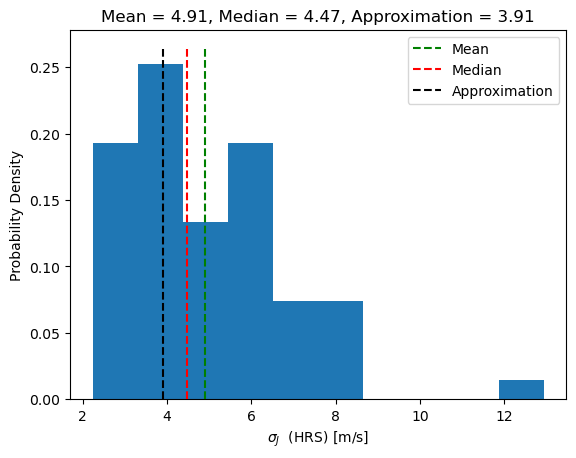

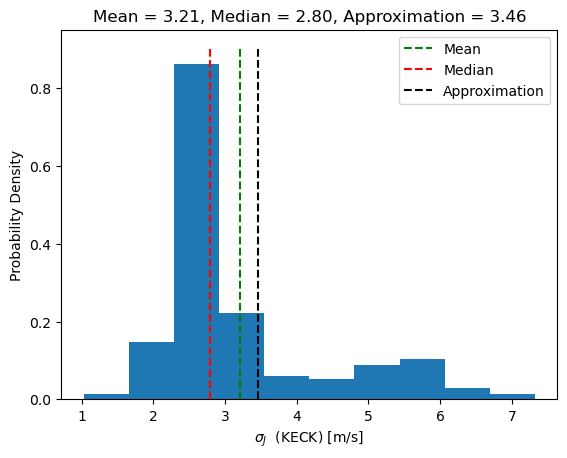

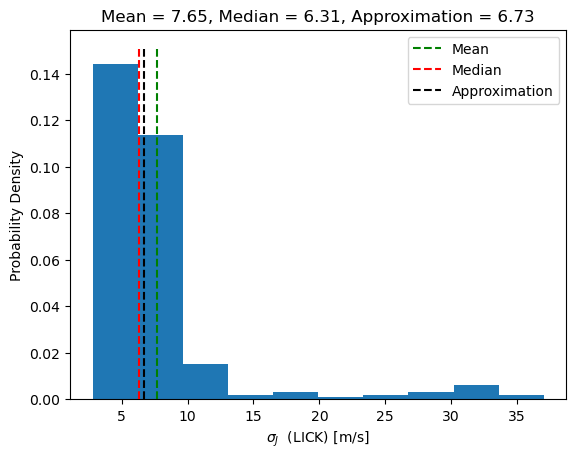

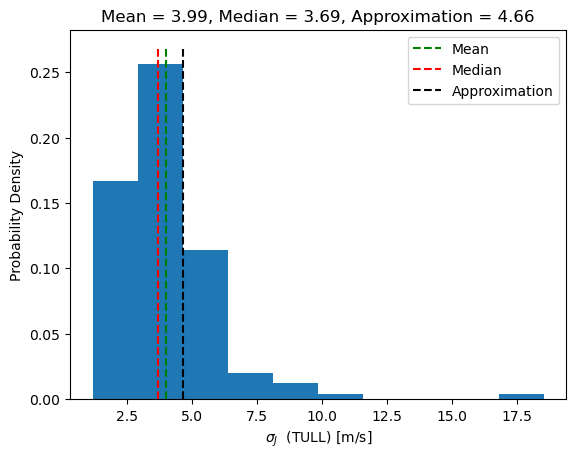

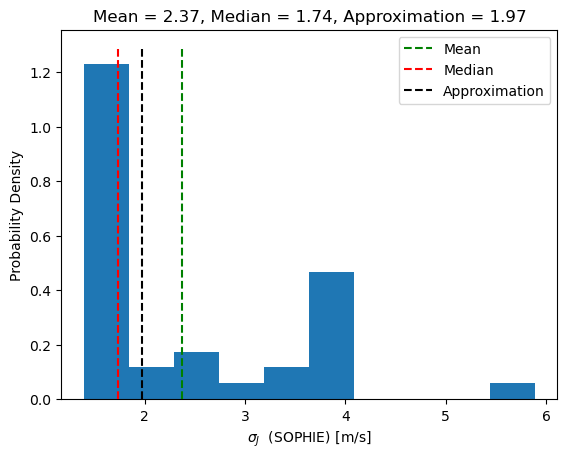

In [31]:
jitter_vec = {}
for inst in ['HRS', 'KECK', 'LICK', 'TULL', 'SOPHIE']: 
    kinst = instruments == inst
    jitter_vec[inst] = np.sqrt((popt_cdf_mean0[inst]**2-1) *RVerr_Bourrier[kinst]**2)
    plt.hist(jitter_vec[inst], density=True) # bins = 20,
    ymin, ymax = plt.ylim()
    plt.vlines([np.mean(jitter_vec[inst])], ymin, ymax, color = 'g', ls = '--', zorder = 10, label = "Mean")
    plt.vlines([np.median(jitter_vec[inst])], ymin, ymax, color = 'r', ls = '--', zorder = 12, label = "Median")
    plt.vlines([jitter_estimate[inst]], ymin, ymax, color = 'k', ls = '--', zorder = 14, label = "Approximation")
    plt.title("Mean = {0:.2f}".format(np.mean(jitter_vec[inst])) + ", Median = {0:.2f}".format(np.median(jitter_vec[inst]))+", Approximation = {0:.2f}".format(jitter_estimate[inst]))
    plt.xlabel('$\sigma_J$ ' +' (' +inst+ ') [m/s]')
    plt.ylabel("Probability Density")
    plt.legend(loc = 'upper right')
    plt.show()
    plt.close()

In [32]:
jitter_4pGP = -np.ones(len(time))

for inst in ['HRS', 'KECK', 'LICK', 'TULL', 'SOPHIE']: 
    kinst = instruments == inst
    jitter_vec[inst] = np.sqrt((popt_cdf_mean0[inst]**2-1) *RVerr_Bourrier[kinst]**2)
    print("Median Jitter for ", inst, np.median(jitter_vec[inst]))
    jitter_4pGP[kinst] = np.median(jitter_vec[inst])
    
for inst in ['HARPN', 'HARPS']:
    kinst = instruments == inst
    jitter_4pGP[kinst] = jitter_estimate[inst]
    print("Jitter ESTIMATE for ", inst, jitter_estimate[inst])

Median Jitter for  HRS 4.470490194947289
Median Jitter for  KECK 2.7953121820837907
Median Jitter for  LICK 6.313372193073685
Median Jitter for  TULL 3.6884369569762567
Median Jitter for  SOPHIE 1.7351678174457916
Jitter ESTIMATE for  HARPN 0.9793621262365012
Jitter ESTIMATE for  HARPS 0.774863404781404


We are now able to compute a reduced $\chi^2$ using our jitter estimates

In [34]:
# Including jitter:
N = len(RV_Bourrier)
r_chi_sqr = (1./(N-len(best_fit_params)))*( (res_final**2)/((rv_err+jitter_4pGP)**2) ).sum()
print("Reduced chi2: ", r_chi_sqr)
print("chi2: ", ( (res_final**2)/((rv_err+jitter_4pGP)**2) ).sum())

Reduced chi2:  0.7536027409492668
chi2:  565.9556584528993


Let's repeat our previous plot of the full model, now incorporating the jitter estimates into the error bars.

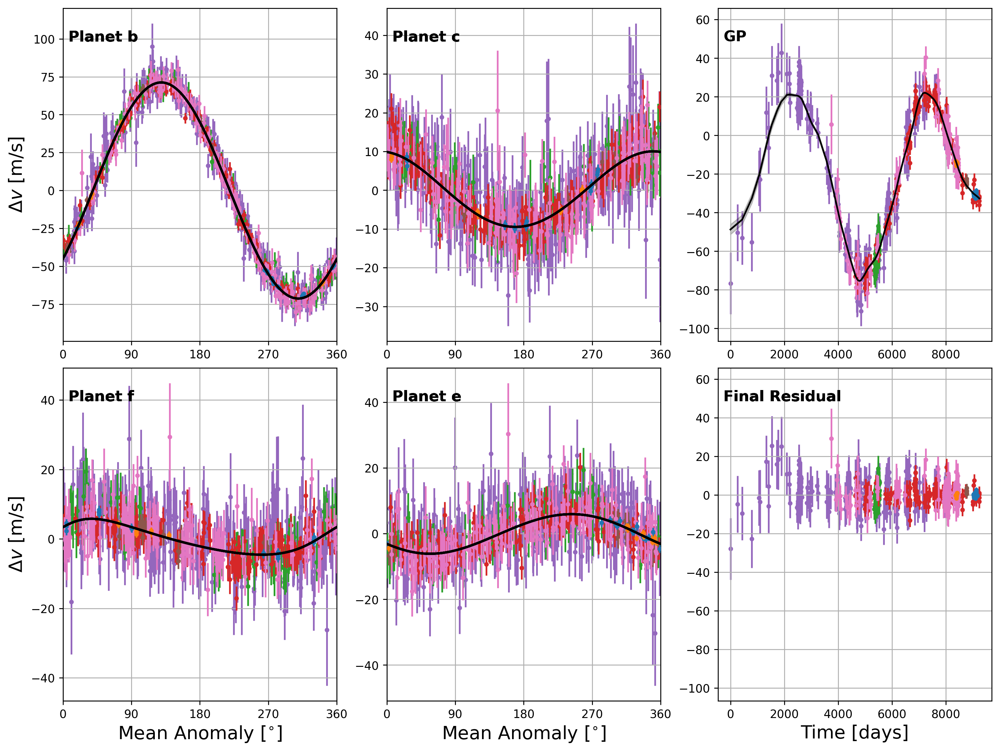

In [35]:
zorder_array = [8, 9, 4, 5, 0, 6, 7]
L = 1000 # Length of the Mmod array

kep_models = np.zeros((L, len(kep_model.keplerian)))
res_models = np.zeros((len(res), len(kep_model.keplerian)))
M_array = np.zeros((len(res), len(kep_model.keplerian)))
Mmod_array = np.zeros((L, len(kep_model.keplerian)))
n_array = np.zeros(len(kep_model.keplerian))

for name in kep_model.keplerian:
    kep = kep_model.keplerian[name]
    param = kep.get_param()
    kep_model.set_keplerian_param(name, param=['n', 'M0', 'K', 'ecosw', 'esinw'])
    n = kep_model.get_param(f'kep.{name}.n')
    M0 = kep_model.get_param(f'kep.{name}.M0')
    kep_model.set_keplerian_param(name, param=param)
    M = (M0 + n*kep_model.t)*180/np.pi % 360
    Mmod = np.linspace(0,360,L)
    tmod = (Mmod*np.pi/180-M0)/n

    M_array[:, int(name)] = M
    Mmod_array[:, int(name)] = Mmod
    kep_models[:, int(name)] = kep.rv(tmod)
    res_models[:, int(name)] = (res_final+kep.rv(kep_model.t))
    n_array[int(name)] = n

labels = ["Planet b", "Planet c", "Planet f", "Planet e"]
def format_axes(fig):
    for i, ax in enumerate(fig.axes):
        ax.text(0.5, 0.5, "ax%d" % (i+1), va="center", ha="center")
        ax.tick_params(labelbottom=False, labelleft=False)

fig = plt.figure(layout="constrained", figsize = (12, 9), dpi = 250.)

gs = GridSpec(2, 3, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, 0])
ax4 = fig.add_subplot(gs[1, 1])
ax5 = fig.add_subplot(gs[0, 2])
ax6 = fig.add_subplot(gs[1, 2])

axes = [ax1, ax2, ax3, ax4, ax5, ax6]
for i in range(len(axes)):
    for j in range(len(np.unique(instruments))): 
        inst = np.unique(instruments)[j]
        kinst = rv_dict['ins_name'] == inst
        
        if i <= 3:
            axes[i].errorbar(M_array[kinst, i], res_models[kinst, i], yerr=(rv_err[kinst]+jitter_4pGP[kinst]), fmt='.', zorder = zorder_array[j], label = inst, rasterized=True)
            axes[i].plot(Mmod_array[:, i], kep_models[:, i], 'k', lw=2, rasterized=True, zorder = 15)
            axes[i].set_xlim(0, 360)
            axes[i].text(0.02, 0.9, labels[i], transform=axes[i].transAxes, fontweight = 'bold', fontsize = 13) 
        elif i == 4: 
            axes[i].errorbar(time[kinst], kep_model.residuals()[kinst], yerr=(rv_err[kinst]+jitter_4pGP[kinst]), fmt='.', zorder = zorder_array[j], label = inst, rasterized=True)
        elif i == 5: 
            axes[i].errorbar(time[kinst], (kep_model.residuals()-GP_fit_final)[kinst], yerr=(rv_err[kinst]+jitter_4pGP[kinst]), fmt='.', zorder = zorder_array[j], label = inst, rasterized=True)
            axes[i].text(0.02, 0.9, 'Final Residual', transform=axes[i].transAxes, fontweight = 'bold', fontsize = 13) 
    axes[i].grid(visible=True, which='major', axis='both')
    
axes[4].fill_between(time, GP_fit_final - np.sqrt(pred_var), GP_fit_final + np.sqrt(pred_var),
                    color="k", alpha=0.2, zorder = 0)
axes[4].plot(t_GP_final, GP_fit_final, 'k-', label = "GP fit", zorder = 15)
axes[4].text(0.02, 0.9, "GP", transform=axes[4].transAxes, fontweight = 'bold', fontsize = 13) 

axes[5].set_ylim(axes[4].get_ylim())
axes[2].set_xlabel('Mean Anomaly [$^{\circ}$]', fontsize=16)
axes[3].set_xlabel('Mean Anomaly [$^{\circ}$]', fontsize=16)
axes[5].set_xlabel('Time [days]', fontsize=16)
axes[0].set_ylabel('$\Delta v$ [m/s]', fontsize=16)
axes[2].set_ylabel('$\Delta v$ [m/s]', fontsize=16)

axes[0].set_xticks([0,90,180,270,360], labels=None)
axes[1].set_xticks([0,90,180,270,360], labels=None)
axes[2].set_xticks([0,90,180,270,360])
axes[3].set_xticks([0,90,180,270,360])
axes[4].set_xticks([0,2000,4000,6000,8000], labels=None)
plt.show()
plt.close()

# Gaussian Filter Detrending
Let's return to our frequency domain search for planets, now using a Gaussian filter to remove the long-term trend. We will make use of our previously found instrument offsets.

In [36]:
'''Function that smooths the time series with Gaussian averaging'''
# Inputs: observation times (Julian dates or such), y-values at each time,
# smoothing scale length
def Gsmooth(times, yvals, scale):
    nobs = len(times) # Number of observations
    ysmooth = np.zeros(nobs)
    for i in range(nobs):
        Gk = Gausskern(times, times[i], scale)
        Gausssum = np.sum(Gk)
        ysmooth[i] = np.sum(yvals*Gk) / Gausssum
    return(ysmooth)

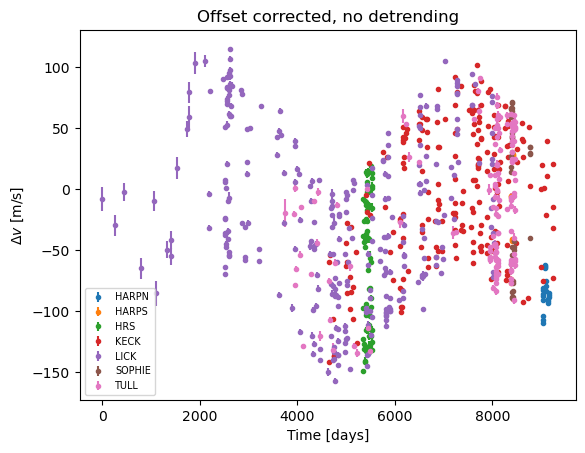

In [37]:
RV_offset_corrected = np.zeros(len(rv_dict['rv']))

plt.figure()
for inst in np.unique(instruments):
    kinst = rv_dict['ins_name'] == inst
    RV_offset_corrected[kinst] = rv_dict['rv'][kinst] - kep_model.get_param(f'lin.offset_inst_{inst}')
    plt.errorbar(rv_dict['jd'][kinst],
        rv_dict['rv'][kinst] - kep_model.get_param(f'lin.offset_inst_{inst}'),
        yerr=rv_err[kinst],
        fmt='.', rasterized=True, label = inst)
plt.xlabel('Time [days]')
plt.ylabel('$\Delta v$ [m/s]')
plt.title("Offset corrected, no detrending")
plt.legend(loc = 'lower left', fontsize = 'x-small')
plt.show()

Let's see how Gaussian filtering works using a filter width of $\sigma = 500$ days. For a comparison, we'll plot the GP model we found previously alongside the GF trend.

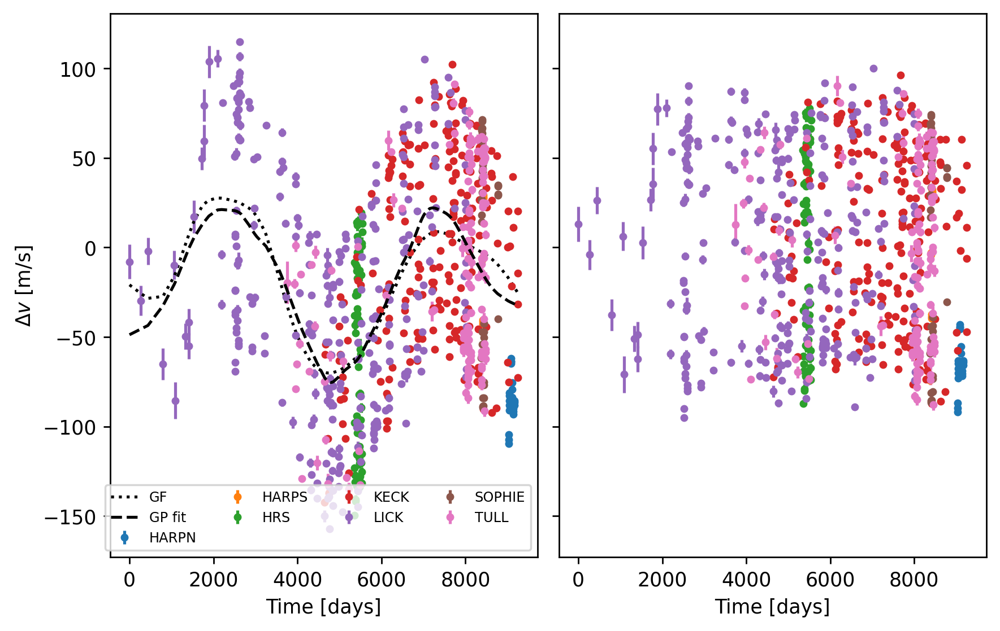

In [38]:
GF = Gsmooth(rv_dict['jd'], RV_offset_corrected, 500.)

f, axes = plt.subplots(1, 2, sharey=True, figsize = (8, 5), dpi = 250.)     
for inst in np.unique(instruments):
    kinst = rv_dict['ins_name'] == inst
    axes[0].errorbar(rv_dict['jd'][kinst], 
        RV_offset_corrected[kinst],
        yerr=rv_err[kinst],
        fmt='.', rasterized=False, label = inst)
    axes[1].errorbar(rv_dict['jd'][kinst], 
        (RV_offset_corrected - GF)[kinst],
        yerr=rv_err[kinst],
        fmt='.', rasterized=False, label = inst)

axes[0].plot(rv_dict['jd'], GF, ':', color = 'k', label = "GF")
axes[0].plot(t_GP_final, GP_fit_final, 'k--', label = "GP fit", zorder = 15)
axes[0].legend(loc = 'lower right', fontsize = 'x-small', ncol=int((len(np.unique(instruments))+1)/2))
axes[0].set_xlabel('Time [days]') 
axes[1].set_xlabel('Time [days]') 
axes[0].set_ylabel('$\Delta v$ [m/s]')
plt.subplots_adjust(wspace = 0.05)
plt.show()

Above is the GF detrending effect in the time domain. Let's view its effects in the frequency domain aswell. As it turns out, planet b is such a strong signal that we won't be able to appreciate the benefits of our detrending until we remove it - so we'll do just that.

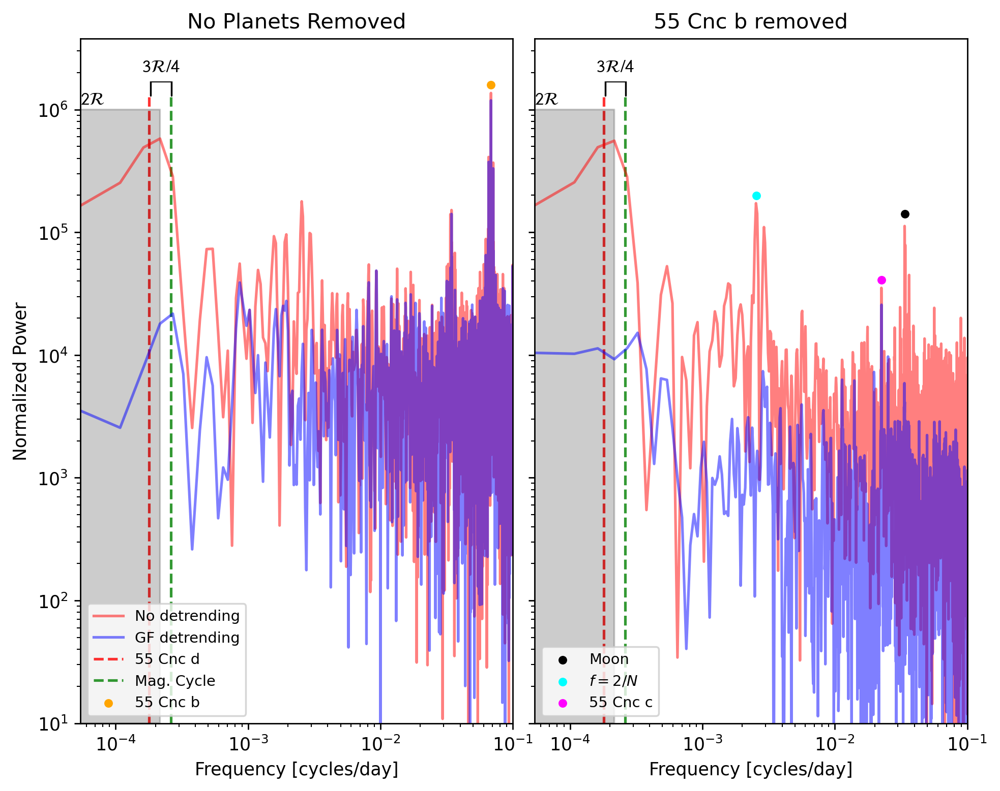

In [39]:
# Compute the power spectra of detrended and non-detrended, and compare
RR = 1./(max(rv_dict['jd'])-rv_dict['jd'][0])
df = RR/2
f_N = 1./(2*np.median(np.diff(rv_dict['jd']))) # Nyquist frequency
f = np.arange(0, f_N, df)

GLS_object_trended = LombScargle(time, RV_offset_corrected, normalization = 'psd') # Pre-plan the periodogram
pls_trended = GLS_object_trended.power(f[1:]) # Exclude 0 frequency to avoid divide by zero

GLS_object_detrended = LombScargle(time, RV_offset_corrected-GF, normalization = 'psd') # Pre-plan the periodogram
pls_detrended = GLS_object_detrended.power(f[1:]) # Exclude 0 frequency to avoid divide by zero

#================ Same thing but now remove planet b. Can we find planet c??
orbit_b = kep_model.keplerian['0'].rv(kep_model.t)

GLS_object_trended_bremoved = LombScargle(time, RV_offset_corrected-orbit_b, normalization = 'psd') # Pre-plan the periodogram
pls_trended_bremoved = GLS_object_trended_bremoved.power(f[1:]) # Exclude 0 frequency to avoid divide by zero

GLS_object_detrended_bremoved = LombScargle(time, RV_offset_corrected-GF-orbit_b, normalization = 'psd') # Pre-plan the periodogram
pls_detrended_bremoved = GLS_object_detrended_bremoved.power(f[1:]) # Exclude 0 frequency to avoid divide by zero
#=============

fig, axes = plt.subplots(1, 2, sharey=True, sharex=True, figsize = (9, 7), dpi = 250.)

axes[0].loglog(f[1:], normalize(RV_offset_corrected, f, pls_trended),  '-', color = "red", label = "No detrending", alpha = 0.5) 
axes[0].loglog(f[1:], normalize(RV_offset_corrected-GF, f, pls_detrended), 'b-', label = "GF detrending", alpha = 0.5)

axes[1].loglog(f[1:], normalize(RV_offset_corrected-orbit_b, f, pls_trended_bremoved), '-', color = "red", label = None, alpha = 0.5)
axes[1].loglog(f[1:], normalize(RV_offset_corrected-GF-orbit_b, f, pls_detrended_bremoved), 'b-', label = None, alpha = 0.5)

axes[0].text(0.5*RR, 1.1*10**6, "$\mathcal{2R}$")
axes[0].fill_betweenx(np.linspace(10**1, 10**6, 1000), 2*RR, x2 = 0, color = 'k', alpha = 0.2)
axes[0].vlines([1./5574.2], 10**1, 10**6.1, color = 'r', alpha = 0.8, ls = '--', label = "55 Cnc d", zorder = 0)
axes[0].vlines(f_mag, 10**1, 10**6.1, color = 'g', alpha = 0.8, ls = '--', label = "Mag. Cycle", zorder = 0)

axes[1].text(0.5*RR, 1.1*10**6, "$\mathcal{2R}$")
axes[1].fill_betweenx(np.linspace(10**1, 10**6, 1000), 2*RR, x2 = 0, color = 'k', alpha = 0.2)
axes[1].vlines([1./5574.2], 10**1, 10**6.1, color = 'r', alpha = 0.8, ls = '--', label = None, zorder = 0)
axes[1].vlines(f_mag , 10**1, 10**6.1, color = 'g', alpha = 0.8, ls = '--', label = None, zorder = 0)

axes[1].scatter(lunar, 10**5.15, s = 15.0, marker = 'o', color = 'black', label = 'Moon')
axes[1].scatter(2./len(time), 10**5.3, s = 15.0, marker = 'o', color = 'cyan', label = '$f = 2/N$') 
axes[0].scatter(planet_b, 10**6.2, s = 15.0, marker = 'o', color = 'orange', label = '55 Cnc b')
axes[1].scatter(planet_c, 10**4.61, s = 15.0, marker = 'o', color = 'magenta', label = '55 Cnc c', zorder = 0)

axes[0].legend(loc = 'lower left', fontsize = 'small')
axes[1].legend(loc = 'lower left', fontsize = 'small')

axes[0].annotate('$\mathcal{3R/4}$', xy=(np.mean([f_mag, (1./5574.2)]), 10**6.23), xytext=(np.mean([f_mag, (1./5574.2)]), 10**6.28), xycoords='data', 
            ha='center', va='bottom',
            bbox=dict(boxstyle='square', fc='white', color='white'),
            arrowprops=dict(arrowstyle='-[, widthB=0.58, lengthB=0.8', color='k'))
axes[1].annotate('$\mathcal{3R/4}$', xy=(np.mean([f_mag, (1./5574.2)]), 10**6.23), xytext=(np.mean([f_mag, (1./5574.2)]), 10**6.28), xycoords='data', 
            ha='center', va='bottom',
            bbox=dict(boxstyle='square', fc='white', color='white'),
            arrowprops=dict(arrowstyle='-[, widthB=0.58, lengthB=0.8', color='k')) 


axes[0].set_ylim(bottom = 10**1); axes[1].set_ylim(bottom = 10**1)
axes[0].set_xlim(left = f[1], right = 10**(-1)); axes[1].set_xlim(left = f[1], right = 10**(-1))
axes[0].set_xlabel("Frequency [cycles/day]")
axes[1].set_xlabel("Frequency [cycles/day]")
axes[0].set_ylabel("Normalized Power")
axes[0].set_title("No Planets Removed")
axes[1].set_title("55 Cnc b removed")
plt.subplots_adjust(wspace = 0.05)
plt.show()

Without our detrending, planet c (next strongest signal after planet b) becomes less significant than the lunar signal and a spectral window artifact. Let's now continue searching for planets in the frequency domain using the detrended RVs.

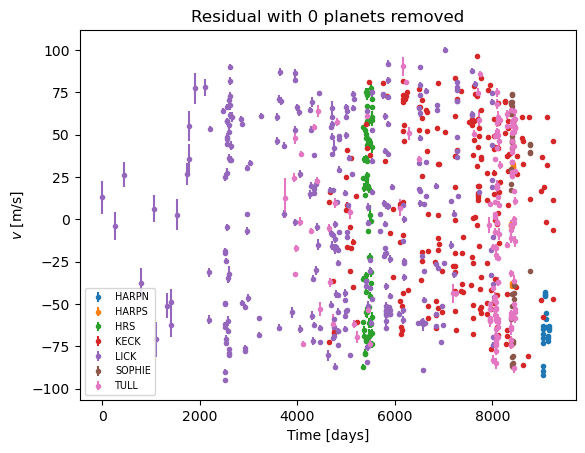

0.0
0.1
0.2
0.4
0.8
Bootstrap took 124.73280239105225 s for 10000 iterations


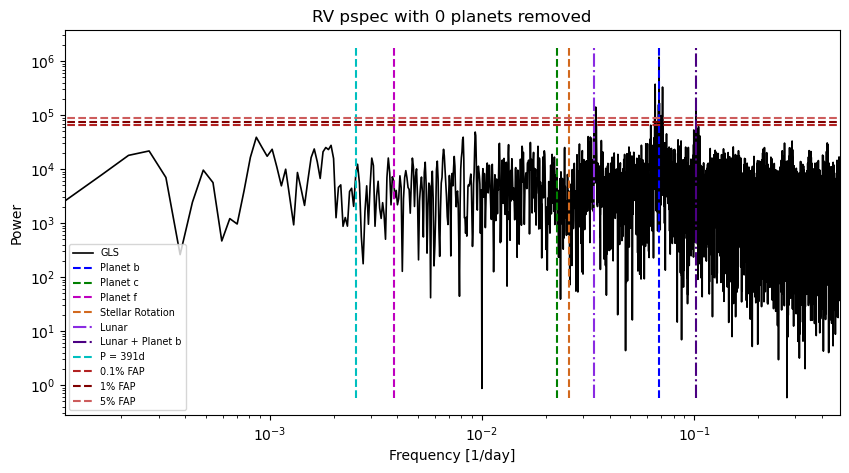

Removing orbit of P=14.653140000000002 d 

Fitting model parameters: 
Parameter                        Value     Error       
kep.0.P                     14.6525165  ±  0.0000129   
kep.0.la0 [deg]                335.859  ±  0.176       
kep.0.K                        80.4097  ±  0.0329      
kep.0.e                       0.047192  ±  0.000438    
kep.0.w [deg]                  101.227  ±  0.544       

loglikelihood = -151097.49782869595



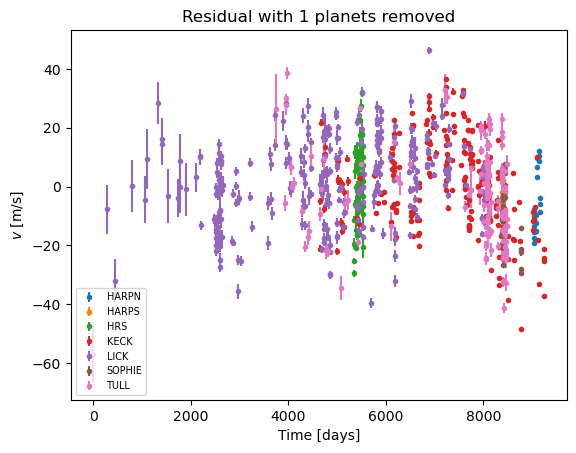

0.0
0.1
0.2
0.4
0.8
Bootstrap took 108.41188263893127 s for 10000 iterations


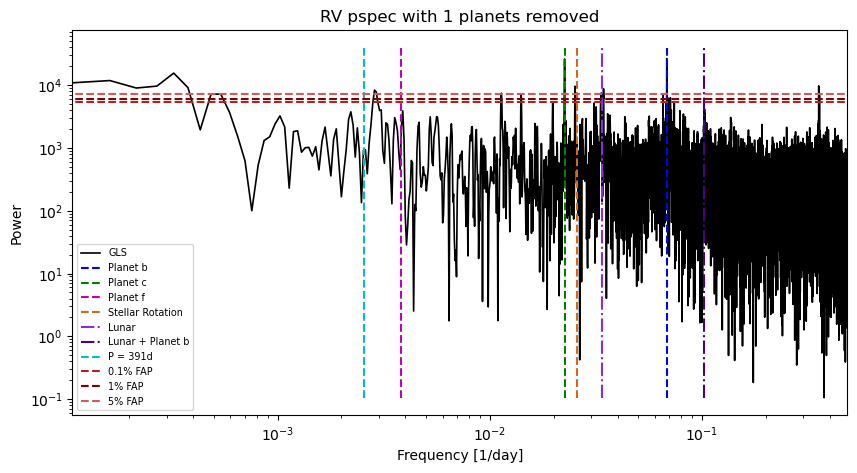

Removing orbit of P=44.373 d 

Fitting model parameters: 
Parameter                        Value     Error       
kep.0.P                     14.6516838  ±  0.0000138   
kep.0.la0 [deg]                325.801  ±  0.186       
kep.0.K                        75.6762  ±  0.0370      
kep.0.e                       0.059922  ±  0.000464    
kep.0.w [deg]                   83.186  ±  0.482       
kep.1.P                      44.468444  ±  0.000769    
kep.1.la0 [deg]                  90.71  ±  1.13        
kep.1.K                        13.3985  ±  0.0418      
kep.1.e                        0.35030  ±  0.00337     
kep.1.w [deg]                  100.761  ±  0.440       

loglikelihood = -80558.85311117665



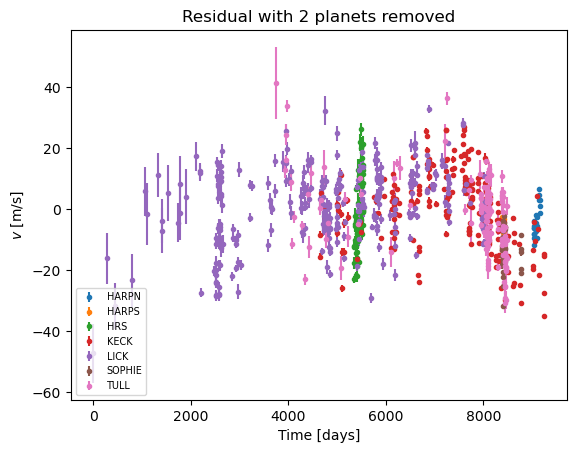

0.0
0.1
0.2
0.4
0.8
Bootstrap took 98.3675172328949 s for 10000 iterations


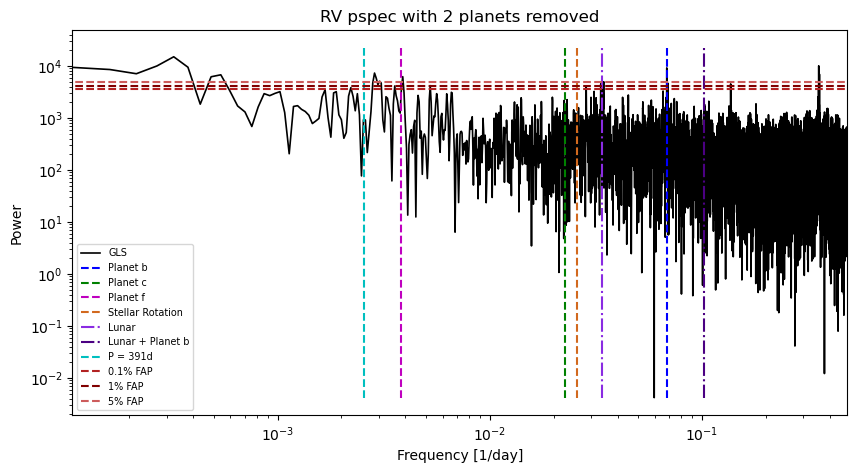

Removing orbit of P=260.91 d 

Fitting model parameters: 
Parameter                        Value     Error       
kep.0.P                     14.6522380  ±  0.0000148   
kep.0.la0 [deg]                331.624  ±  0.197       
kep.0.K                        74.5899  ±  0.0398      
kep.0.e                       0.034595  ±  0.000499    
kep.0.w [deg]                   91.332  ±  0.925       
kep.1.P                       44.39930  ±  0.00105     
kep.1.la0 [deg]                   2.07  ±  1.47        
kep.1.K                        11.4091  ±  0.0345      
kep.1.e                        0.15092  ±  0.00359     
kep.1.w [deg]                   172.65  ±  1.84        
kep.2.P                       260.3454  ±  0.0101      
kep.2.la0 [deg]                341.320  ±  0.861       
kep.2.K                         13.018  ±  0.211       
kep.2.e                        0.95000  ±  0.00235     
kep.2.w [deg]                   252.01  ±  1.07        

loglikelihood = -64480.63481078866



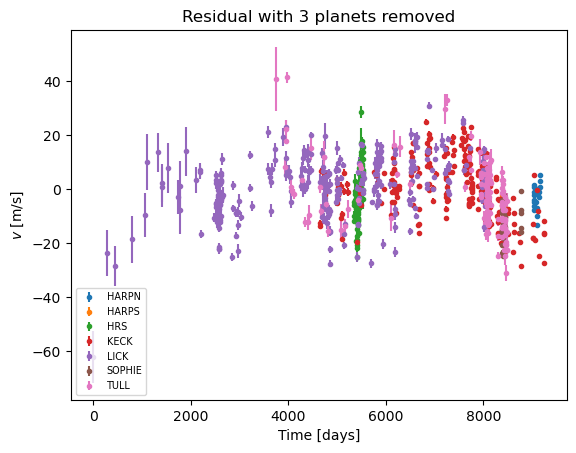

0.0
0.1
0.2
0.4
0.8
Bootstrap took 97.89482593536377 s for 10000 iterations


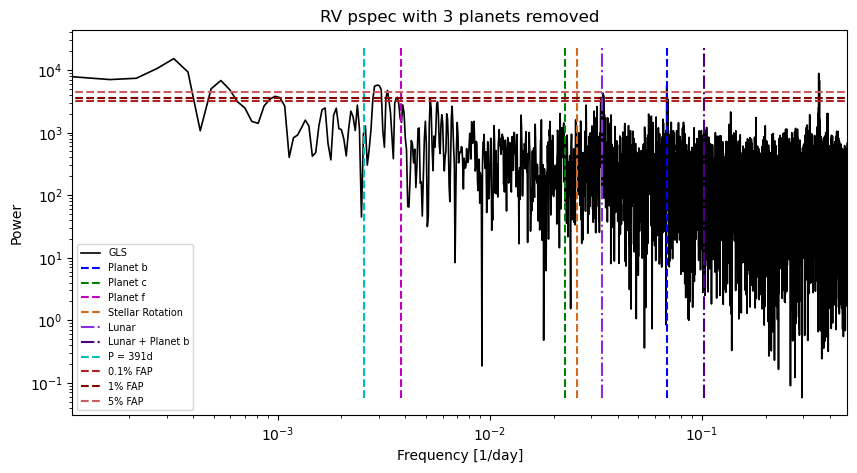

Removing orbit of P=0.7365478 d 

Fitting model parameters: 
Parameter                        Value     Error       
kep.0.P                     14.6517096  ±  0.0000154   
kep.0.la0 [deg]                327.254  ±  0.203       
kep.0.K                        70.6561  ±  0.0376      
kep.0.e                       0.018712  ±  0.000523    
kep.0.w [deg]                   113.95  ±  1.74        
kep.1.P                       44.40980  ±  0.00103     
kep.1.la0 [deg]                  21.54  ±  1.46        
kep.1.K                        10.7053  ±  0.0341      
kep.1.e                        0.14486  ±  0.00389     
kep.1.w [deg]                   142.79  ±  1.37        
kep.2.P                      260.28061  ±  0.00340     
kep.2.la0 [deg]                 324.58  ±  1.23        
kep.2.K                          9.640  ±  0.128       
kep.2.e                        0.95000  ±  0.00151     
kep.2.w [deg]                   237.73  ±  1.21        
kep.3.P                       0.736524  ±  

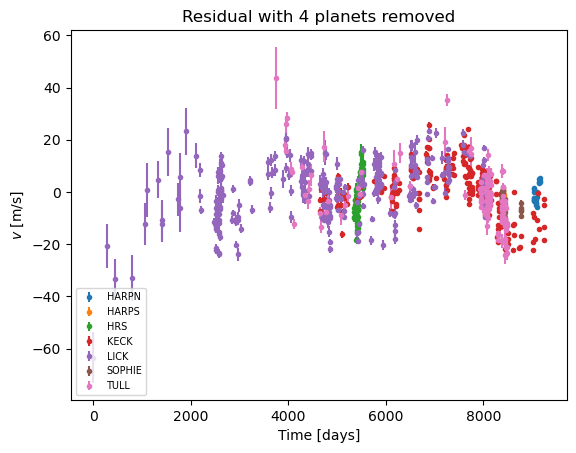

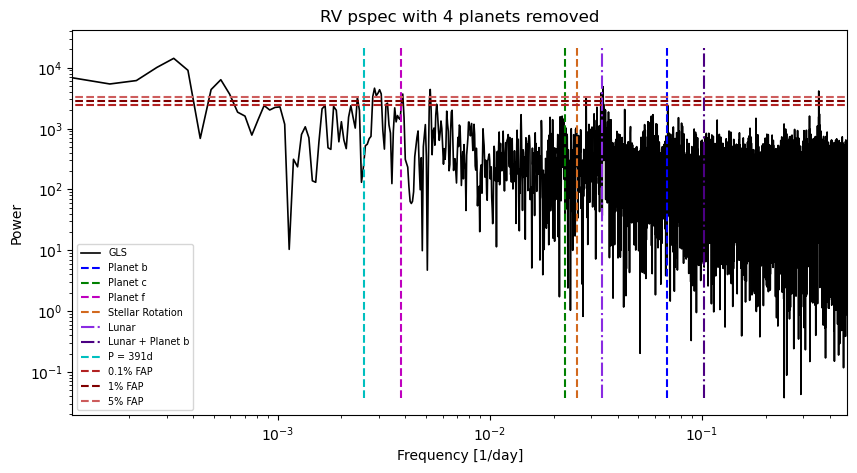

LR cutoff for significance:  15.08627246938899
	 ~~ 55Cnc No Jitter ~~ 
loglike :  [-151097.4978287   -80558.85311118  -64480.63481079  -37802.12853605] 
LR =  [141077.28943504  32156.43660078  53357.01254948] 

p-values:  [0. 0. 0.] 

Bayesian information criterion:  [302328.2327522  161250.94331716 129094.50671639]


In [40]:
detrended_model = rv.RvModel(t_Bourrier-t_Bourrier[0], RV_offset_corrected-GF, err = term.Error(RVerr_Bourrier))

# Construct a dictionary for the RV data, similar to how DACE does 
rv_dict_D = {}
rv_dict_D['jd'] = t_Bourrier-t_Bourrier[0] 
rv_dict_D['rv'] = RV_offset_corrected-GF
rv_dict_D['rv_err'] = RVerr_Bourrier
rv_dict_D['ins_name'] = instruments

model_4pGP_detrended, res, loglike, LR, p_val = remove_kep_without_jitter(rv_dict_D, detrended_model, [planet_b, planet_c, planet_f, planet_e], fit_param = True) 

Keep in mind the GF is not a placement for an activity model, so there is no surprise the last residual above shows more to do. Let's simplify the above and just look at the GLS periodograms of each RV residual, after fitting for and removing planets b, c, e, and f:

0.0
0.1
0.2
0.4
0.8
Bootstrap took 103.74587297439575 s for 10000 iterations
0.0
0.1
0.2
0.4
0.8
Bootstrap took 97.95836067199707 s for 10000 iterations
0.0
0.1
0.2
0.4
0.8
Bootstrap took 99.1388750076294 s for 10000 iterations
0.0
0.1
0.2
0.4
0.8
Bootstrap took 98.40743899345398 s for 10000 iterations
0.0
0.1
0.2
0.4
0.8
Bootstrap took 97.73014950752258 s for 10000 iterations


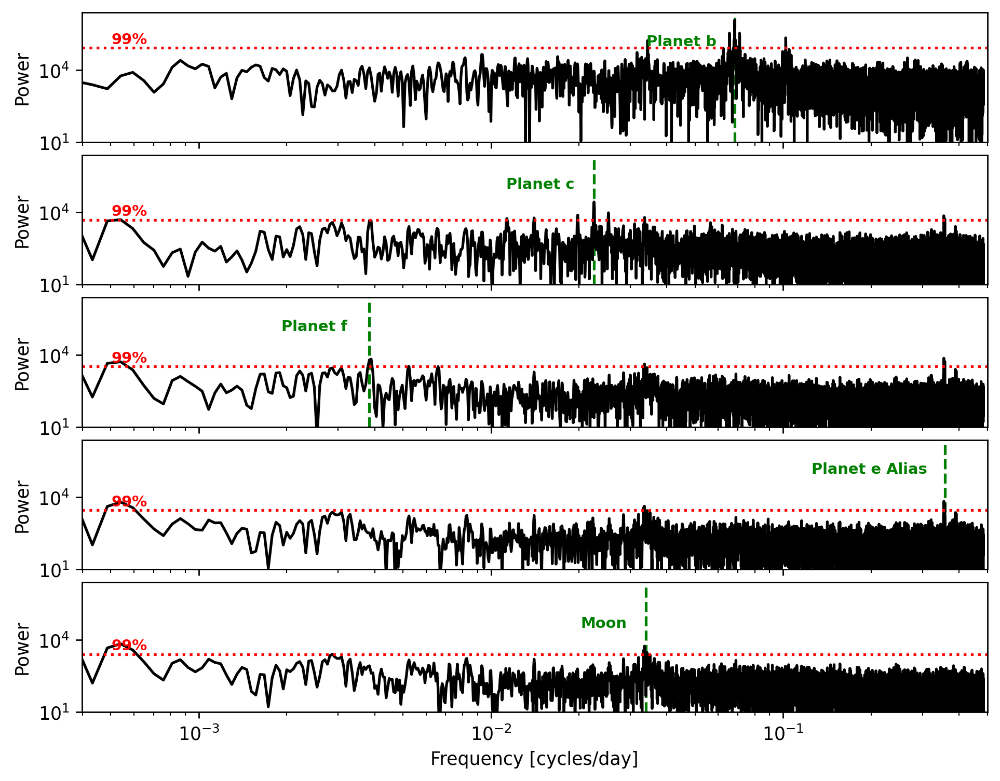

In [41]:
signals = [planet_b, planet_c, planet_f, planet_e]
labels = ["Planet b", "Planet c", "Planet f", "Planet e Alias"] # We use the planet e alias because the true planet e lies outside of the domain
all_perc = np.zeros((3, len(signals)+1))
fig, axes = plt.subplots(len(signals)+1, 1, sharex=True, figsize = (9, 7), dpi = 250.)     
for i in range(len(signals)+1):
    ts = np.loadtxt(f'text_outputs/D_residual_{i}.txt')[:, 1] # Read in detrended residuals, for simplicity
    fls_4pGP, pls_4pGP, GLS_window_4pGP, percentiles_4pGP  = GLS_calc(t_Bourrier-t_Bourrier[0], ts, bootstrap = True) 
    all_perc[:, i] = percentiles_4pGP

    axes[i].loglog(fls_4pGP, pls_4pGP, 'k-')
    
    ymin, ymax = axes[0].get_ylim()  
    
    xmin = 10**(-3.4); xmax = 0.5
    ymin = 10
    axes[i].set_ylim(ymin, ymax)
    axes[i].set_xlim(xmin, xmax)
    axes[i].hlines(np.max(all_perc[:, i]), xmin, xmax, label = None, linestyles = ':', color = 'r')
    axes[i].text(10**(-3.3), 1.5*np.max(all_perc[:, i]), '99%', fontsize = 'small', fontweight = 'bold', color = 'r') 

    if i <= 2:
        axes[i].vlines(signals[i], ymin, 5*ymax, label = None, linestyles = '--', color = 'g', zorder = 1)
        axes[i].text(0.5*signals[i], 10**5, labels[i], fontsize = 'small', fontweight = 'bold', color = 'g') 
    elif i == 3:
        axes[i].vlines(planet_e - 1, ymin, 5*ymax, label = None, linestyles = '--', color = 'g', zorder = 1)
        axes[i].text(0.35*(planet_e - 1), 10**5, labels[i], fontsize = 'small', fontweight = 'bold', color = 'g') 

    axes[i].set_ylabel('Power')

axes[i].vlines(lunar, ymin, 5*ymax, label = None, linestyles = '--', color = 'g', zorder = 1)     
axes[i].text(0.6*lunar, 10**(4.5), "Moon", fontsize = 'small', fontweight = 'bold', color = 'g') 
axes[i].set_xlabel('Frequency [cycles/day]')
plt.subplots_adjust(hspace = 0.1)
plt.show()
plt.close()